# Brainspan alignment

Goal: investigate how different DS filter levels influence alignment with Brainspan. Using RNAseq brainspan data

## Setup

In [1]:
%cd work/notebooks

# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

# Import local code
import sys
sys.path.append('/home/jovyan/work/code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from brainspan import *
from enrichments import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");

/home/jovyan/work/notebooks


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down


## Get brainspan RNAseq data

In [4]:
bs_dir = "../data/brainspan-data/gene_matrix_rnaseq/"
bs_exp, bs_col, bs_row = get_brainspan(bs_dir)

## Define Brainspan to HCP mapping

In [6]:
# bs_cortex_mapping = get_bs_cortex_mapping()
hcp_bs_mapping = get_hcp_bs_mapping_v2()

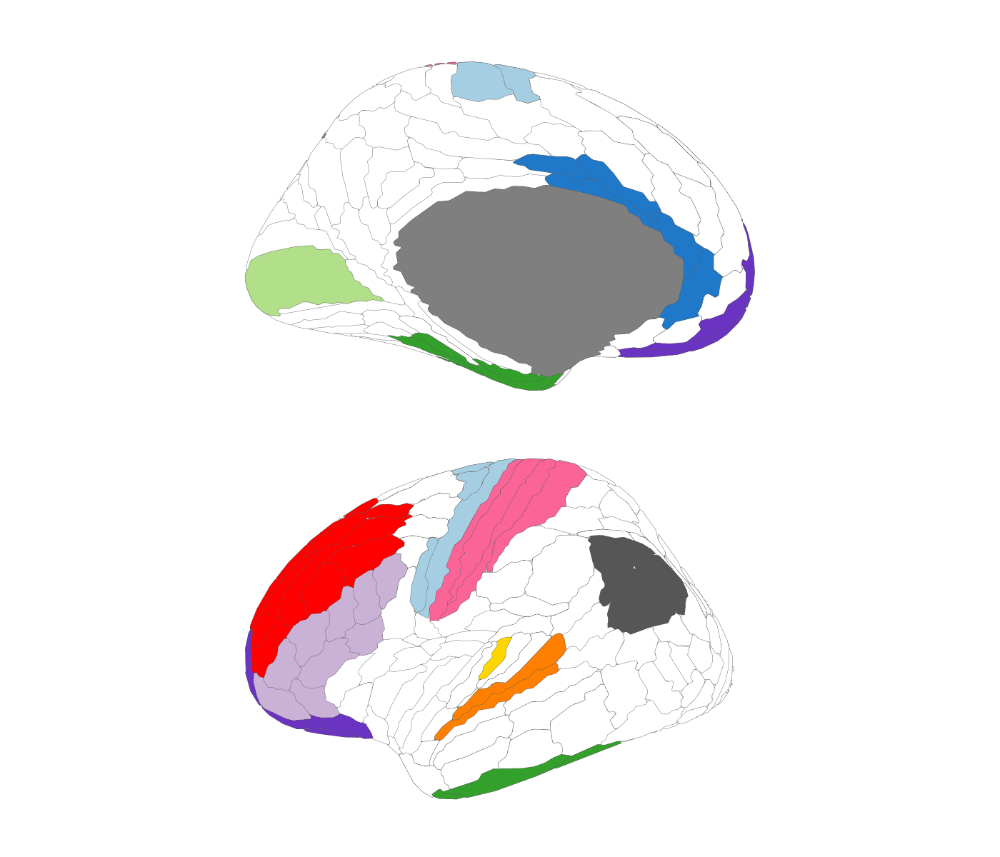

In [5]:
%%R -i hcp_bs_mapping -w 1400 -h 1200
source("../code/brainspanPlots.R")
plot_bs_hcp_mapping(hcp_bs_mapping)

## Get gradients in HCP parcellation

In [7]:
# dm_hcp_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds9')
dm_hcp_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')
# dm_hcp_3d_ds6 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds6')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


Get gradients in matched HCP cortices — this is the pattern we try to replicate in Brainspan

In [8]:
version = dm_hcp_3d_ds5
weights = dm_hcp_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1)
hcp_mapped_scores = get_mapped_scores(version, hcp_bs_mapping)
hcp_mapped_scores

,G1,G2,G3
structure_name,,,
anterior (rostral) cingulate (medial prefrontal) cortex,-1.469995,0.103764,0.942484
dorsolateral prefrontal cortex,-0.239559,1.112302,-0.700620
"inferolateral temporal cortex (area TEv, area 20)",-1.366754,-0.986777,-0.230106
orbital frontal cortex,-1.081844,0.076778,-0.834724
posterior (caudal) superior temporal cortex (area 22c),-0.211739,-0.181999,-1.285625
posteroventral (inferior) parietal cortex,0.297152,-0.193724,-1.230635
primary auditory cortex (core),1.223799,-0.807299,1.242271
"primary motor cortex (area M1, area 4)",0.524399,1.806451,1.214904
"primary somatosensory cortex (area S1, areas 3,1,2)",1.021798,0.126883,0.685525


## Clean up Brainspan

In [9]:
# pd.set_option('display.max_columns', 500)
# age_region_counts = count_samples(bs_col, bs_cortex_mapping)
# age_region_counts

In [10]:
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)

In [11]:
bs_clean.head()

gene_symbol                                                                                    TSPAN6  \
donor_id gender age   structure_name                                     structure_acronym              
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                19.998231   
                      anterior (rostral) cingulate (medial prefrontal... MFC                44.587799   
                      dorsolateral prefrontal cortex                     DFC                44.943915   
                      orbital frontal cortex                             OFC                41.084665   
                      inferolateral temporal cortex (area TEv, area 20)  ITC                23.640053   

gene_symbol                                                                                      DPM1  \
donor_id gender age   structure_name                                     structure_acronym              
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                19.228431   
                      anterior (rostral) cingulate (medial prefrontal... MFC                32.903100   
                      dorsolateral prefrontal cortex                     DFC                38.157569   
                      orbital frontal cortex                             OFC                29.371442   
                      inferolateral temporal cortex (area TEv, area 20)  ITC                19.390473   

gene_symbol                                                                                    SCYL3  \
donor_id gender age   structure_name                                     structure_acronym             
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                2.948976   
                      anterior (rostral) cingulate (medial prefrontal... MFC                3.483817   
                      dorsolateral prefrontal cortex                     DFC                3.609830   
                      orbital frontal cortex                             OFC                3.287066   
                      inferolateral temporal cortex (area TEv, area 20)  ITC                3.308546   

gene_symbol                                                                                 C1orf112  \
donor_id gender age   structure_name                                     structure_acronym             
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                2.177235   
                      anterior (rostral) cingulate (medial prefrontal... MFC                3.741580   
                      dorsolateral prefrontal cortex                     DFC                3.560650   
                      orbital frontal cortex                             OFC                2.804860   
                      inferolateral temporal cortex (area TEv, area 20)  ITC                2.011409   

gene_symbol                                                                                      FGR  \
donor_id gender age   structure_name                                     structure_acronym             
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                0.467688   
                      anterior (rostral) cingulate (medial prefrontal... MFC                0.204210   
                      dorsolateral prefrontal cortex                     DFC                0.260205   
                      orbital frontal cortex                             OFC                0.460497   
                      inferolateral temporal cortex (area TEv, area 20)  ITC                0.210155   

gene_symbol                                                                                      CFH  \
donor_id gender age   structure_name                                     structure_acronym             
13058    M      8 pcw posterior (caudal) superior temporal cortex (ar... STC                8.457812   
                      anterio

In [12]:
bs_agg = aggregate_brainspan_by_age(bs_clean, normalize=True)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [13]:
bs_agg.groupby('age').size().index

CategoricalIndex(['8 pcw', '12 pcw', '13 pcw', '16 pcw', '17 pcw', '19 pcw',
                  '21 pcw', '24 pcw', '37 pcw', '4 mos', '10 mos', '1 yrs',
                  '2 yrs', '3 yrs', '8 yrs', '11 yrs', '13 yrs', '18 yrs',
                  '19 yrs', '21 yrs', '23 yrs', '30 yrs', '36 yrs', '37 yrs',
                  '40 yrs'],
                 categories=['8 pcw', '9 pcw', '12 pcw', '13 pcw', '16 pcw', '17 pcw', '19 pcw', '21 pcw', ...], ordered=True, dtype='category', name='age')

In [14]:
bs_scores = compute_brainspan_scores(bs_agg, version)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


## Brainspan continuous

In [15]:
df = (bs_clean
 .reset_index()
 .assign(age = lambda x: age_to_continuous(x['age']))
 .drop('structure_name', axis=1)
 .rename({'structure_acronym':'region'}, axis=1)
)
df.head()

gene_symbol,donor_id,gender,age,region,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,...,RP11-707P17.1,RP11-126F18.2,HSP90B2P,RP11-752G15.4,RP5-977B1.11,RP5-977B1.12,AL589988.1,RP11-56B16.3,CTA-204B4.6,FDPSL2A
0,13058,M,56.0,STC,19.998231,19.228431,2.948976,2.177235,0.467688,8.457812,...,10.077468,3.826911,23.727382,9.374590,17.148670,16.857190,38.435957,1.606816,7.921930,7.905227
1,13058,M,56.0,MFC,44.587799,32.903100,3.483817,3.741580,0.204210,0.862773,...,7.410084,4.223378,26.722143,9.607023,5.525802,6.787384,34.467817,0.557455,6.207200,11.278053
2,13058,M,56.0,DFC,44.943915,38.157569,3.609830,3.560650,0.260205,1.511365,...,6.733952,3.685531,19.469926,13.169902,6.940819,6.799896,29.419697,0.721704,4.564048,14.341258
3,13058,M,56.0,OFC,41.084665,29.371442,3.287066,2.804860,0.460497,3.010299,...,5.342362,3.851078,27.198347,13.465134,21.457221,7.806781,34.717931,0.862448,2.874455,8.713868
4,13058,M,56.0,ITC,23.640053,19.390473,3.308546,2.011409,0.210155,1.102334,...,11.720694,2.747048,19.911957,8.392513,2.845868,17.421432,43.767293,0.735116,7.101335,7.101158


In [16]:
df_plot = (df
    .loc[:,['donor_id','gender','age','region']+['SST', 'MBP', 'GFAP', 'NEFL', 'LGALS1', 'SYT6']]
    .melt(id_vars=['donor_id','gender','age','region'])
)

In [17]:
bs_clean.reset_index().loc[:,['structure_name','structure_acronym']].drop_duplicates()

gene_symbol,structure_name,structure_acronym
0,posterior (caudal) superior temporal cortex (a...,STC
1,anterior (rostral) cingulate (medial prefronta...,MFC
2,dorsolateral prefrontal cortex,DFC
3,orbital frontal cortex,OFC
4,"inferolateral temporal cortex (area TEv, area 20)",ITC
5,ventrolateral prefrontal cortex,VFC
9,primary auditory cortex (core),A1C
10,"primary visual cortex (striate cortex, area V1...",V1C
12,"primary motor cortex (area M1, area 4)",M1C
17,posteroventral (inferior) parietal cortex,IPC


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


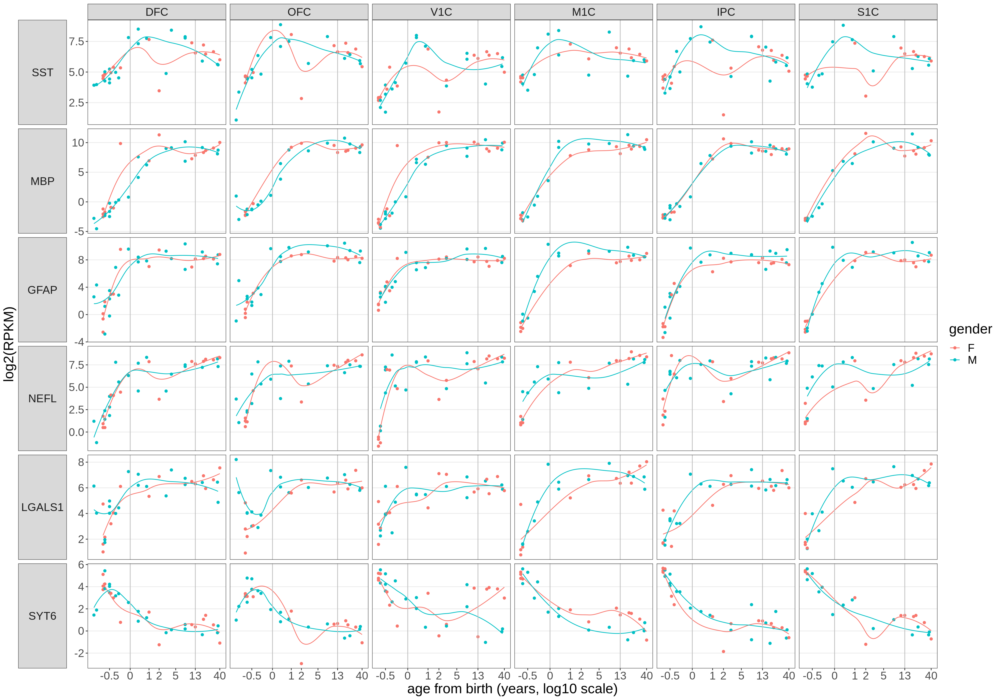

In [19]:
%%R -i df_plot -w 20 -h 14 --units in -r 200
df_plot %>% 
filter(region %in% c('V1C', 'S1C', 'M1C', 'DFC', 'IPC', 'OFC')) %>% 
mutate(region = factor(region, ordered=T, levels=unique(.$region))) %>% 
mutate(gene_symbol = factor(gene_symbol, ordered=T, levels=unique(.$gene_symbol))) %>% 
ggplot(aes(x=log10(age), y=log2(value))) +
facet_grid(gene_symbol ~ region, scales='free', switch='y') +
geom_point(aes(color=gender)) +
geom_smooth(aes(color=gender, group=gender),se=F, size=.5) +
geom_vline(xintercept=log10(c(40*7, 40*7+13*365)), color='grey') +
scale_x_continuous(breaks=log10(c(16*7,40*7,40*7+1*365, 40*7+2*365, 40*7+5*365, 40*7+13*365, 40*7+40*365)), 
                   labels=function(x) round((10^x-40*7)/365,1), name='age from birth (years, log10 scale)') +
ylab('log2(RPKM)') +
theme_bw() + 
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.major.x=element_blank(), panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside')

In [20]:
matched_genes = np.intersect1d(bs_clean.columns, weights.index)

posneg_genes = (pd.concat({
    'neg': weights.loc[matched_genes].rank(),
    'pos': weights.loc[matched_genes].rank(ascending=False)
    })
    .melt(ignore_index=False, var_name='G', value_name='rank')
    .query('rank<=10')
    .reset_index().rename({'level_0':'posneg', 'level_1':'gene'},axis=1)
    .assign(G = lambda x: x['G']+x['posneg'])
    .sort_values(['G','rank'])
)
# posneg_genes

bs_melt = (bs_clean
 .loc[:, posneg_genes['gene']]
 .reset_index()
 .assign(age = lambda x: age_to_continuous(x['age']))
 .drop('structure_name', axis=1)
 .rename({'structure_acronym':'region'}, axis=1)
 .melt(id_vars=['donor_id','gender','age','region'], var_name='gene')
)

df_axes_plot = (posneg_genes.join(bs_melt.set_index('gene'), on='gene')
                .drop(['donor_id'],axis=1).fillna({'gender':'F'})
                )
df_axes_plot

,posneg,gene,G,rank,gender,age,region,value
8,neg,SSTR1,G1neg,1.0,M,56.0,STC,1.815272
8,neg,SSTR1,G1neg,1.0,M,56.0,MFC,2.000532
8,neg,SSTR1,G1neg,1.0,M,56.0,DFC,0.947101
8,neg,SSTR1,G1neg,1.0,M,56.0,OFC,1.050728
8,neg,SSTR1,G1neg,1.0,M,56.0,ITC,6.814945
...,...,...,...,...,...,...,...,...
55,pos,LMCD1,G3pos,10.0,F,14880.0,OFC,1.052275
55,pos,LMCD1,G3pos,10.0,F,14880.0,STC,1.157180
55,pos,LMCD1,G3pos,10.0,F,14880.0,IPC,0.882817
55,pos,LMCD1,G3pos,10.0,F,14880.0,M1C,4.682027


/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


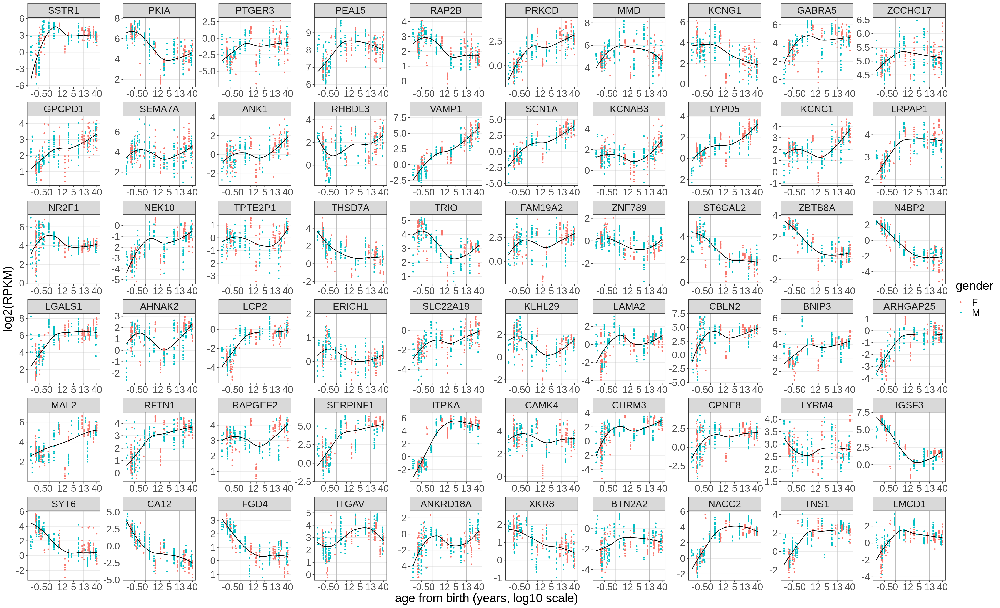

In [21]:
%%R -i df_axes_plot -w 23 -h 14 --units in -r 200
df_axes_plot %>% 
# filter(region %in% c('V1C', 'S1C', 'M1C', 'DFC', 'IPC', 'OFC')) %>% 
# mutate(region = factor(region, ordered=T, levels=unique(.$region))) %>% 
mutate(gene = factor(gene, ordered=T, levels=unique(.$gene))) %>% 
ggplot(aes(x=log10(age), y=log2(value))) +
# facet_grid(G ~ number, scales='free', switch='y') +
facet_wrap(~gene, scales='free', ncol=10) +
geom_point(aes(color=gender),size=.5) +
geom_smooth(color='black',se=F, size=.5) +
geom_vline(xintercept=log10(c(40*7, 40*7+13*365)), color='grey') +
scale_x_continuous(breaks=log10(c(16*7,40*7,40*7+1*365, 40*7+2*365, 40*7+5*365, 40*7+13*365, 40*7+40*365)), 
                   labels=function(x) round((10^x-40*7)/365,1), name='age from birth (years, log10 scale)') +
ylab('log2(RPKM)') +
theme_bw() + 
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.major.x=element_blank(), panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside')

### Normalise Brainspan genes to 75th percentile

In [36]:
bs_norm = bs_clean.apply(lambda x: x/np.quantile(x, .75))
# bs_norm = bs_clean.apply(lambda x: np.log2(x)/np.quantile(x, .75))

In [37]:
# Use normalised
bs_melt = (bs_norm
 .loc[:, posneg_genes['gene']]
 .reset_index()
 .assign(age = lambda x: age_to_continuous(x['age']))
 .drop('structure_name', axis=1)
 .rename({'structure_acronym':'region'}, axis=1)
 .melt(id_vars=['donor_id','gender','age','region'], var_name='gene')
)

df_genes_plot = (posneg_genes.join(bs_melt.set_index('gene'), on='gene')
                .drop(['donor_id'],axis=1).fillna({'gender':'F'})
                )
df_genes_plot

,posneg,gene,G,rank,gender,age,region,value
8,neg,SSTR1,G1neg,1.0,M,56.0,STC,0.124620
8,neg,SSTR1,G1neg,1.0,M,56.0,MFC,0.137338
8,neg,SSTR1,G1neg,1.0,M,56.0,DFC,0.065019
8,neg,SSTR1,G1neg,1.0,M,56.0,OFC,0.072133
8,neg,SSTR1,G1neg,1.0,M,56.0,ITC,0.467851
...,...,...,...,...,...,...,...,...
55,pos,LMCD1,G3pos,10.0,F,14880.0,OFC,0.492380
55,pos,LMCD1,G3pos,10.0,F,14880.0,STC,0.541467
55,pos,LMCD1,G3pos,10.0,F,14880.0,IPC,0.413087
55,pos,LMCD1,G3pos,10.0,F,14880.0,M1C,2.190811


/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


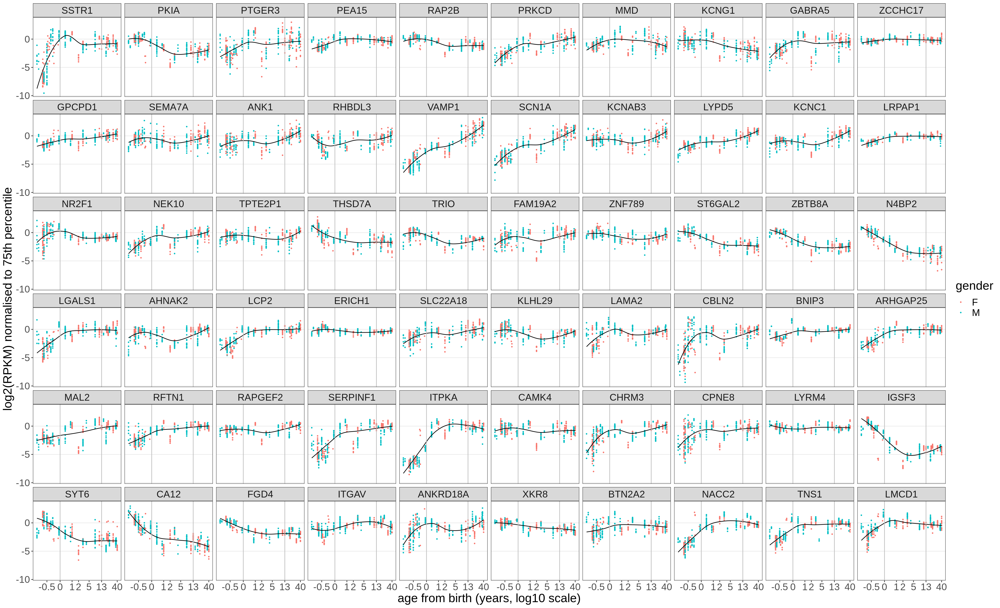

In [38]:
%%R -i df_genes_plot -w 23 -h 14 --units in -r 200
genes_plot <- df_genes_plot %>% 
# filter(region %in% c('V1C', 'S1C', 'M1C', 'DFC', 'IPC', 'OFC')) %>% 
# mutate(region = factor(region, ordered=T, levels=unique(.$region))) %>% 
mutate(gene = factor(gene, ordered=T, levels=unique(.$gene))) %>% 
# ggplot(aes(x=log10(age), y=value)) +
ggplot(aes(x=log10(age), y=log2(value))) +
# facet_grid(G ~ number, scales='free', switch='y') +
facet_wrap(~gene, ncol=10) +
geom_point(aes(color=gender),size=.5) +
geom_smooth(color='black',se=F, size=.5) +
geom_vline(xintercept=log10(c(40*7, 40*7+13*365)), color='grey') +
scale_x_continuous(breaks=log10(c(16*7,40*7,40*7+1*365, 40*7+2*365, 40*7+5*365, 40*7+13*365, 40*7+40*365)), 
                   labels=function(x) round((10^x-40*7)/365,1), name='age from birth (years, log10 scale)') +
ylab('log2(RPKM) normalised to 75th percentile') + #ylim(0,4) +
theme_bw() + 
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.major.x=element_blank(), panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside')

genes_plot

### Axes plots

In [22]:
# weights
dm_hcp_3d_ds5.eigenvalues

array([0.02292726, 0.00815051, 0.00626257, 0.00404451, 0.00354475])

In [42]:
top_n = 10
# top_n = np.Inf

matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
weights_m = weights.loc[matched_genes,:]
# neg=pd.DataFrame(np.where((weights_m < 0) & (weights_m.rank() <= top_n), weights_m, 0), 
#                  index=weights_m.index, columns=weights_m.columns) * -1
# pos=pd.DataFrame(np.where((weights_m > 0) & (weights_m.rank(ascending=False) <= top_n), weights_m, 0), 
#                  index=weights_m.index, columns=weights_m.columns)


# Simple average
neg=pd.DataFrame(np.where((weights_m < 0) & (weights_m.rank() <= top_n), 1, 0), 
                 index=weights_m.index, columns=weights_m.columns)
pos=pd.DataFrame(np.where((weights_m > 0) & (weights_m.rank(ascending=False) <= top_n), 1, 0), 
                 index=weights_m.index, columns=weights_m.columns)

posneg = neg.join(pos, lsuffix=f'neg{top_n}', rsuffix=f'pos{top_n}')

bs_axes_posneg_by_region_age_donor = bs_norm.loc[:, matched_genes] @ posneg

In [43]:
df_axes_plot = (bs_axes_posneg_by_region_age_donor
 .reset_index()
 .assign(age = lambda x: age_to_continuous(x['age']))
 .drop('structure_name', axis=1)
 .rename({'structure_acronym':'region'}, axis=1)
 .melt(id_vars=['donor_id','gender','age','region'], var_name='G')
)
df_axes_plot

,donor_id,gender,age,region,G,value
0,13058,M,56.0,STC,G1neg10,5.288555
1,13058,M,56.0,MFC,G1neg10,6.560402
2,13058,M,56.0,DFC,G1neg10,5.420879
3,13058,M,56.0,OFC,G1neg10,7.490522
4,13058,M,56.0,ITC,G1neg10,8.093880
...,...,...,...,...,...,...
2107,12304,F,14880.0,OFC,G3pos10,4.420319
2108,12304,F,14880.0,STC,G3pos10,5.278710
2109,12304,F,14880.0,IPC,G3pos10,4.041143
2110,12304,F,14880.0,M1C,G3pos10,5.050488


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


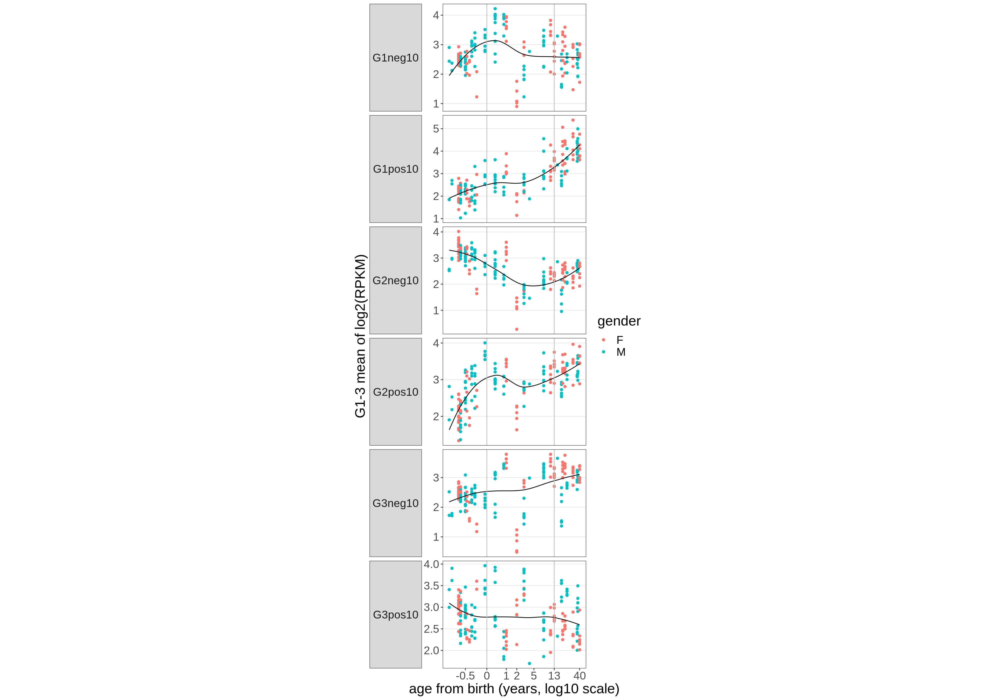

In [44]:
%%R -i df_axes_plot -w 20 -h 14 --units in -r 200
df_axes_plot %>% 
filter(region %in% c('V1C', 'S1C', 'M1C', 'DFC', 'IPC', 'OFC')) %>% 
mutate(region = factor(region, ordered=T, levels=unique(.$region))) %>% 
# ggplot(aes(x=log10(age), y=value)) +
ggplot(aes(x=log10(age), y=log2(value))) +
# facet_grid(G ~ region, switch='y') +
facet_grid(G ~ ., switch='y', scales='free') +
geom_point(aes(color=gender)) +
geom_smooth(color='black',se=F, size=.5) +
geom_vline(xintercept=log10(c(40*7, 40*7+13*365)), color='grey') +
scale_x_continuous(breaks=log10(c(16*7,40*7,40*7+1*365, 40*7+2*365, 40*7+5*365, 40*7+13*365, 40*7+40*365)), 
                   labels=function(x) round((10^x-40*7)/365,1), name='age from birth (years, log10 scale)') +
ylab('G1-3 mean of log2(RPKM)') +
theme_bw() + 
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.major.x=element_blank(), panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside', aspect.ratio=0.75)

In [1071]:
high = 1
low = 0.5

motifs = (bs_norm.loc[:,posneg_genes['gene']]
 .reset_index().assign(age_group = lambda x: x['age'].map(get_age_groups()))
 .drop('donor_id', axis=1)
 .groupby('age_group').mean()
#  .apply(lambda x: np.where(x>high, 'H', 'L'))
 .apply(lambda x: np.select([x>high, x<low],['H','L'], default='M'))
 .melt(ignore_index=False).rename({'gene_symbol':'gene'}, axis=1)
 .reset_index().pivot(index='gene', columns='age_group', values='value')
 .assign(motif = lambda x: x['Pre-Birth']+x['Birth-13 yrs']+x['18-40 yrs']).loc[:,['motif']]
 .join(posneg_genes.set_index('gene')).sort_values(['G','rank'])
 .reset_index()
#  .pivot(index='G', columns='rank', values='motif')
)
motifs.head()

,gene,motif,posneg,G,rank
0,SSTR1,LMM,neg,G1neg,1.0
1,PKIA,HLL,neg,G1neg,2.0
2,PTGER3,LHH,neg,G1neg,3.0
3,PEA15,LHM,neg,G1neg,4.0
4,RAP2B,HML,neg,G1neg,5.0


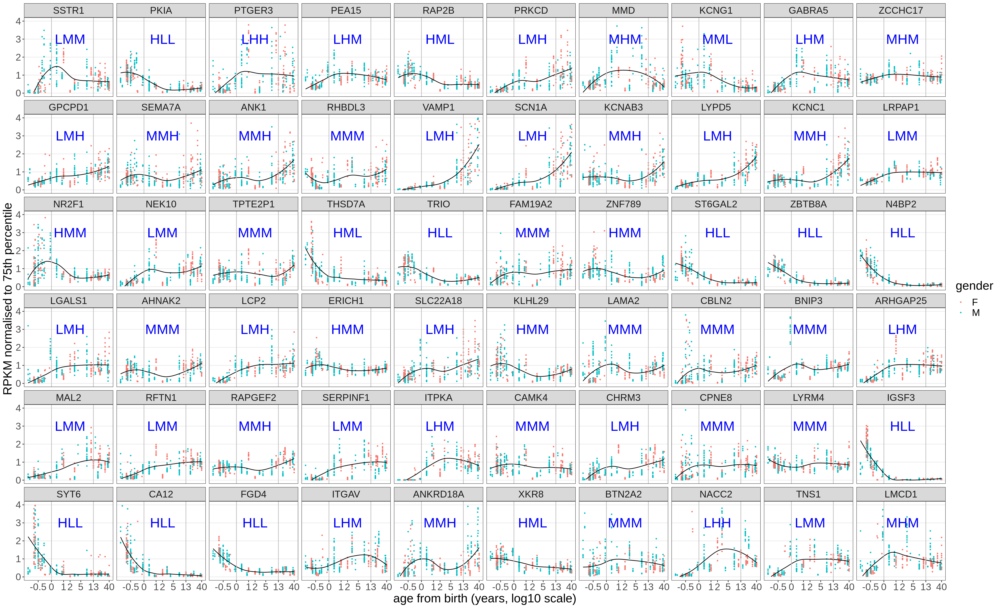

In [1072]:
%%R -i motifs -w 23 -h 14 --units in -r 200
motifs <- motifs %>% mutate(gene = factor(gene, ordered=T, levels=unique(.$gene)))
genes_plot + geom_text(data=motifs, aes(label=motif, x=log10(40*7+365*2), y=3), size=8, color='blue')

In [1073]:
top_n = 1000

posneg_genes_all = (pd.concat({
    'neg': weights.loc[matched_genes].rank(),
    'pos': weights.loc[matched_genes].rank(ascending=False)
    })
    .melt(ignore_index=False, var_name='G', value_name='rank')
    .query(f'rank<={top_n}')
    .reset_index().rename({'level_0':'posneg', 'level_1':'gene'},axis=1)
    .assign(G = lambda x: x['G']+x['posneg'])
    .sort_values(['G','rank'])
)

motifs_all = (bs_clean.loc[:,posneg_genes_all['gene']]
 .reset_index().assign(age_group = lambda x: x['age'].map(get_age_groups()))
 .drop('donor_id', axis=1)
 .groupby('age_group').mean()
#  .apply(lambda x: np.where(x>high, 'H', 'L'))
 .apply(lambda x: np.select([x>high, x<low],['H','L'], default='M'))
 .melt(ignore_index=False).rename({'gene_symbol':'gene'}, axis=1)
 .reset_index().drop_duplicates()
 .pivot(index='gene', columns='age_group', values='value')
 .assign(motif = lambda x: x['Pre-Birth']+x['Birth-13 yrs']+x['18-40 yrs']).loc[:,['motif']]
 .join(posneg_genes_all.set_index('gene').drop(['posneg'],axis=1), on='gene')
 .reset_index()
)
motifs_all.head()
# motifs_all.shape

,gene,motif,G,rank
0,A1BG,HHH,G1neg,411.0
1,AAGAB,HHH,G2pos,256.0
2,AAGAB,HHH,G3neg,594.0
3,AAK1,HHH,G1pos,718.0
4,AARS,HHH,G2pos,668.0


In [1074]:
motifs_all.pivot_table(index='G', columns='motif', values='gene', aggfunc='count')

motif,HHH,HHL,HHM,HLL,HLM,HMH,HML,HMM,LHH,LHM,...,LML,LMM,MHH,MHM,MLH,MLL,MLM,MMH,MML,MMM
G,,,,,,,,,,,,,,,,,,,,,
G1neg,882.0,2.0,13.0,4.0,NaN,3.0,3.0,8.0,9.0,3.0,...,3.0,7.0,27.0,6.0,NaN,1.0,1.0,1.0,3.0,11.0
G1pos,828.0,NaN,6.0,2.0,NaN,11.0,2.0,19.0,15.0,NaN,...,NaN,13.0,53.0,NaN,1.0,5.0,2.0,6.0,1.0,9.0
G2neg,808.0,NaN,16.0,12.0,3.0,13.0,7.0,39.0,11.0,1.0,...,2.0,7.0,28.0,3.0,NaN,7.0,2.0,5.0,4.0,13.0
G2pos,858.0,NaN,9.0,5.0,NaN,NaN,NaN,8.0,15.0,1.0,...,3.0,12.0,52.0,8.0,NaN,2.0,NaN,4.0,3.0,8.0
G3neg,891.0,NaN,3.0,NaN,1.0,1.0,2.0,8.0,15.0,1.0,...,NaN,5.0,47.0,4.0,NaN,2.0,1.0,2.0,NaN,2.0
G3pos,733.0,1.0,29.0,11.0,1.0,7.0,7.0,14.0,19.0,3.0,...,6.0,17.0,74.0,19.0,1.0,9.0,NaN,3.0,4.0,16.0


`summarise()` has grouped output by 'G'. You can override using the `.groups` argument.


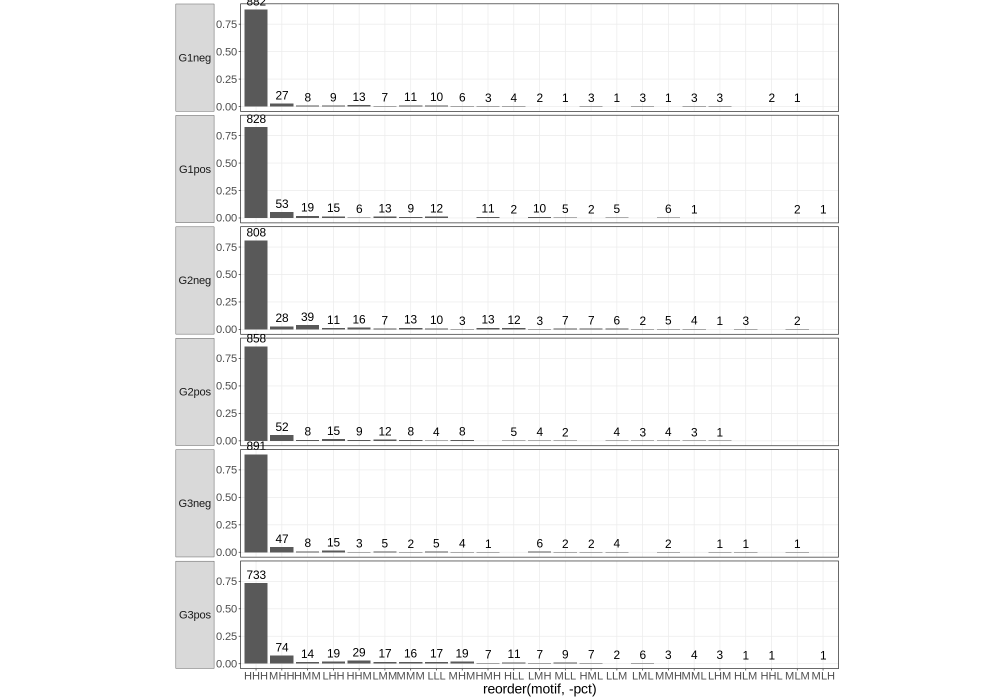

In [1075]:
%%R -i motifs_all -w 20 -h 14 -u in -r 100
motifs_all %>% 
group_by(G, motif) %>% 
summarise(n=n()) %>% 
mutate(pct=n/sum(n)) %>%
ggplot(aes(x=reorder(motif,-pct), y=pct)) + 
geom_col() +
geom_text(aes(label=n), vjust=-.5, size=6) +
facet_grid(G~., switch='y') + 
ylab('') +
theme_bw() + 
coord_cartesian(clip='off') +
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside', aspect.ratio=0.18
)    

`summarise()` has grouped output by 'G'. You can override using the `.groups` argument.


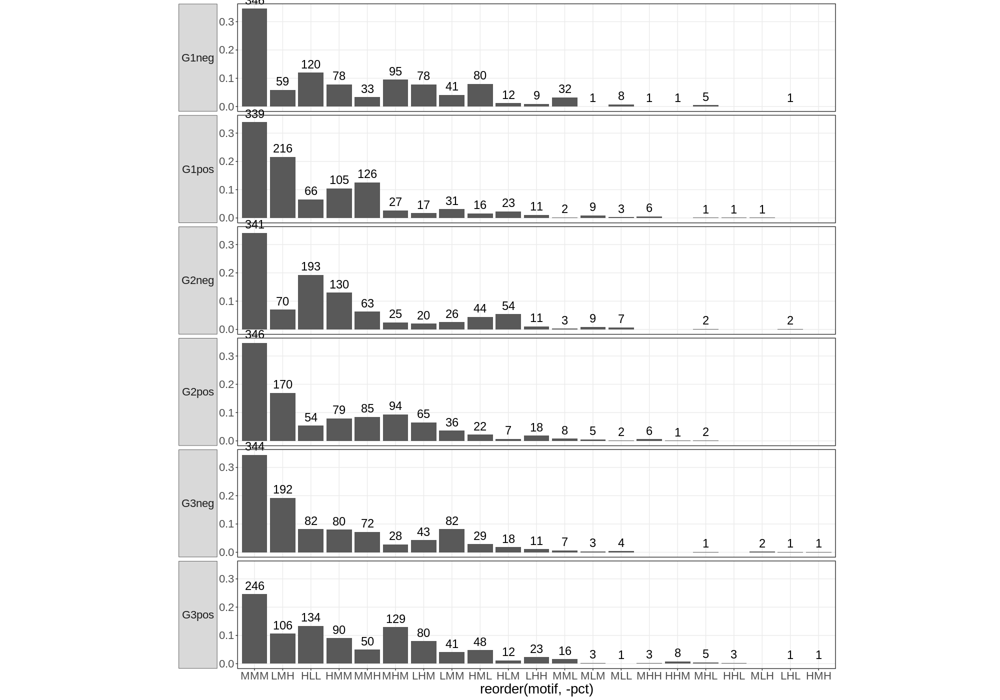

In [ ]:
%%R -i motifs_all -w 20 -h 14 -u in -r 100
motifs_all %>% 
group_by(G, motif) %>% 
summarise(n=n()) %>% 
mutate(pct=n/sum(n)) %>%
ggplot(aes(x=reorder(motif,-pct), y=pct)) + 
geom_col() +
geom_text(aes(label=n), vjust=-.5, size=6) +
facet_grid(G~., switch='y') + 
ylab('') +
theme_bw() + 
coord_cartesian(clip='off') +
theme(text=element_text(size=20), panel.grid.minor.x=element_blank(), 
    panel.grid.minor.y=element_blank(),
    strip.text.y.left=element_text(angle=0), strip.placement='outside', aspect.ratio=0.18
)    

### Model? (not done)

In [351]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import dmatrices
# y, X = dmatrices('SST ~ age + gender + region', data=df, return_type='dataframe')
# mod = sm.OLS(y, X).fit()

genes = ['SST', 'MBP', 'GFAP', 'NEFL', 'LGALS1', 'SYT6']
models = {}
for gene in genes:
    formula = f'{gene} ~ age + gender + region'
    models[gene] = smf.ols(formula=formula, data=df).fit()

In [354]:
df_new = pd.DataFrame({
    'age': range(1,40),
    'gender': 'F',
    'region': 'DFC'
})

preds = {gene:models[gene].predict(df_new) for gene in genes}
df_new.join(pd.concat(preds,axis=1)).head()

,age,gender,region,SST,MBP,GFAP,NEFL,LGALS1,SYT6
0,1,F,DFC,145.473109,589.110317,331.748819,138.488801,89.361607,2.082255
1,2,F,DFC,143.566276,587.403862,329.725579,143.633655,89.625210,2.065774
2,3,F,DFC,141.659443,585.697407,327.702339,148.778509,89.888812,2.049294
3,4,F,DFC,139.752609,583.990953,325.679098,153.923363,90.152415,2.032814
4,5,F,DFC,137.845776,582.284498,323.655858,159.068217,90.416018,2.016334


eval_env: 1


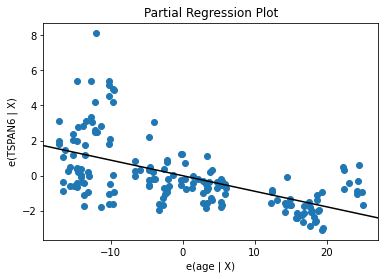

In [313]:
sm.stats.linear_rainbow(mod)
sm.graphics.plot_partregress('TSPAN6','age', ['gender', 'region'], data=df, obs_labels=False);

In [214]:
matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
bs_axes_by_region_age_donor = bs_clean.loc[:, matched_genes] @ weights.loc[matched_genes,:]
bs_axes_by_region_age_donor

G1  \
donor_id age    structure_name                                                   
13058    8 pcw  posterior (caudal) superior temporal cortex (ar... -569.896121   
                anterior (rostral) cingulate (medial prefrontal... -594.946846   
                dorsolateral prefrontal cortex                     -685.148710   
                orbital frontal cortex                             -664.282532   
                inferolateral temporal cortex (area TEv, area 20)  -629.387830   
...                                                                        ...   
12304    40 yrs orbital frontal cortex                             -244.341828   
                posterior (caudal) superior temporal cortex (ar... -148.688938   
                posteroventral (inferior) parietal cortex          -180.486409   
                primary motor cortex (area M1, area 4)             -502.067999   
                primary somatosensory cortex (area S1, areas 3,... -411.563855   

                                                                            G2  \
donor_id age    structure_name                                                   
13058    8 pcw  posterior (caudal) superior temporal cortex (ar...  260.389928   
                anterior (rostral) cingulate (medial prefrontal...  276.456019   
                dorsolateral prefrontal cortex                      348.060068   
                orbital frontal cortex                              341.996461   
                inferolateral temporal cortex (area TEv, area 20)   253.311768   
...                                                                        ...   
12304    40 yrs orbital frontal cortex                              322.440396   
                posterior (caudal) superior temporal cortex (ar...  323.805890   
                posteroventral (inferior) parietal cortex           344.849630   
                primary motor cortex (area M1, area 4)              584.239493   
                primary somatosensory cortex (area S1, areas 3,...  562.639076   

                                                                            G3  
donor_id age    structure_name                                                  
13058    8 pcw  posterior (caudal) superior temporal cortex (ar... -163.429671  
                anterior (rostral) cingulate (medial prefrontal...  -75.344753  
                dorsolateral prefrontal cortex                     -104.093744  
                orbital frontal cortex                              -79.446958  
                inferolateral temporal cortex (area TEv, area 20)  -203.820854  
...                                                                        ...  
12304    40 yrs orbital frontal cortex                             -517.645850  
                posterior (caudal) superior temporal cortex (ar... -468.330236  
                posteroventral (inferior) parietal cortex          -537.718542  
                primary motor cortex (area M1, area 4)             -438.015925  
                primary somatosensory cortex (area S1, areas 3,... -490.542619  

[352 rows x 3 columns]

## Brainspan amplitudes LEGACY

### All genes

In [44]:
matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
bs_axes_by_region_age_donor = bs_clean.loc[:, matched_genes] @ weights.loc[matched_genes,:]

In [71]:
bs_axes_by_age_donor = (
    bs_axes_by_region_age_donor.groupby(['donor_id', 'age']).mean().dropna()
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby('G')['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_by_age_donor.head()

,donor_id,age,G,score,z
81,13058,8 pcw,G2,297.072106,-0.144400
39,13058,8 pcw,G1,-625.322811,-1.021142
123,13058,8 pcw,G3,-126.985213,0.859289
101,12833,9 pcw,G3,-80.057370,1.139996
59,12833,9 pcw,G2,201.246701,-1.448053


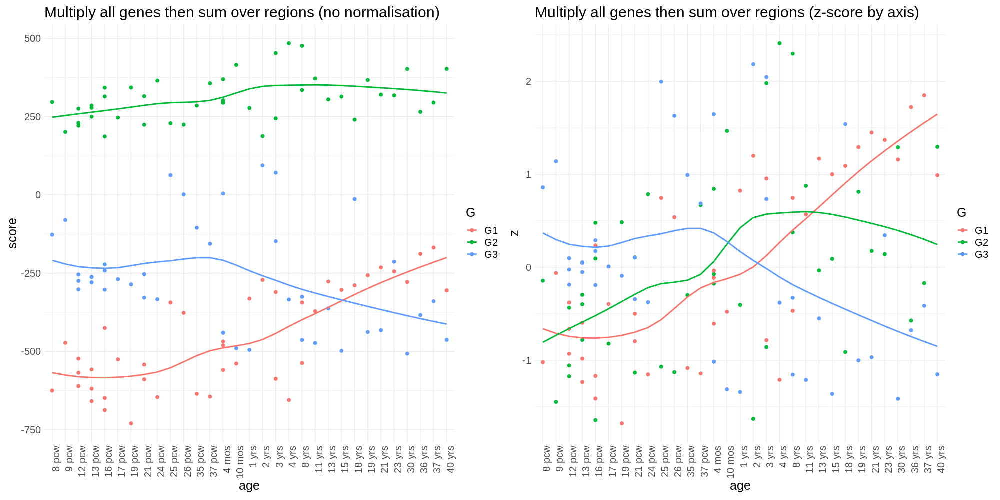

In [79]:
%%R -i bs_axes_by_age_donor -w 20 -h 10 --units in -r 100

g1 <- bs_axes_by_age_donor %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply all genes then sum over regions (no normalisation)')

g2 <- bs_axes_by_age_donor %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply all genes then sum over regions (z-score by axis)')

g1 + g2


### Absolute values all genes

In [142]:
matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
bs_axes_by_region_age_donor = bs_clean.loc[:, matched_genes] @ weights.abs().loc[matched_genes,:]

In [143]:
bs_axes_by_age_donor = (
    bs_axes_by_region_age_donor.groupby(['donor_id', 'age']).mean().dropna()
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby('G')['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_by_age_donor.head()

,donor_id,age,G,score,z
81,13058,8 pcw,G2,853.020450,0.060690
39,13058,8 pcw,G1,1178.161576,0.626411
123,13058,8 pcw,G3,778.205166,-0.553709
101,12833,9 pcw,G3,690.374836,-1.349052
59,12833,9 pcw,G2,757.612936,-0.932622


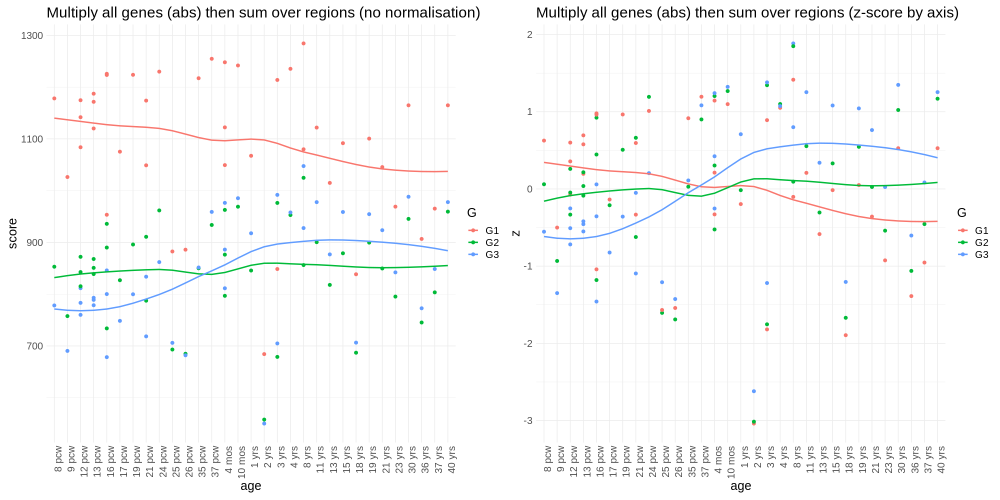

In [144]:
%%R -i bs_axes_by_age_donor -w 20 -h 10 --units in -r 100

g1 <- bs_axes_by_age_donor %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply all genes (abs) then sum over regions (no normalisation)')

g2 <- bs_axes_by_age_donor %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply all genes (abs) then sum over regions (z-score by axis)')

g1 + g2


### Pos/neg genes

In [180]:
negative=pd.DataFrame(np.where(weights<0,weights,0), index=weights.index, columns=weights.columns)
positive=pd.DataFrame(np.where(weights>0,weights,0), index=weights.index, columns=weights.columns)

In [185]:
matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
bs_axes_by_region_age_donor_posneg = pd.concat({
    '+positive genes': bs_clean.loc[:, matched_genes] @ positive.loc[matched_genes,:],
    '-negative genes': bs_clean.loc[:, matched_genes] @ negative.loc[matched_genes,:]
}).reset_index(0).rename({'level_0':'posneg'},axis=1)

In [186]:
bs_axes_by_age_donor_posneg = (
    bs_axes_by_region_age_donor_posneg.groupby(['donor_id', 'age','posneg']).mean().dropna()
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby(['G','posneg'])['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_by_age_donor_posneg.head()

,donor_id,age,posneg,G,score,z
162,13058,8 pcw,+positive genes,G2,575.046278,-0.029389
78,13058,8 pcw,+positive genes,G1,276.419382,-0.686615
79,13058,8 pcw,-negative genes,G1,-901.742193,-0.907724
163,13058,8 pcw,-negative genes,G2,-277.974172,-0.313609
247,13058,8 pcw,-negative genes,G3,-452.595190,0.792497


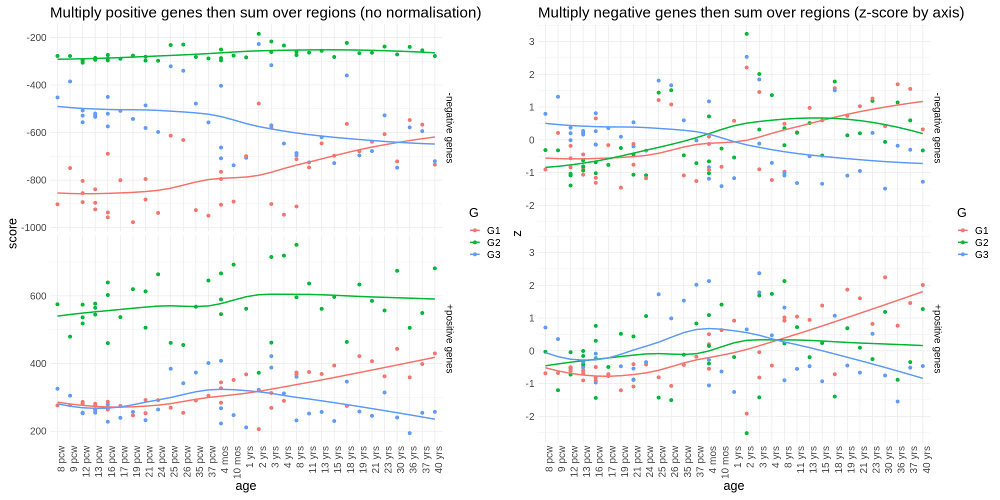

In [188]:
%%R -i bs_axes_by_age_donor_posneg -w 20 -h 10 --units in -r 100

g1 <- bs_axes_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~., scales='free') +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply positive genes then sum over regions (no normalisation)')

g2 <- bs_axes_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply negative genes then sum over regions (z-score by axis)')

g1 + g2


### Top/bottom 100 genes

In [115]:
negative=pd.DataFrame(np.where(np.argsort(weights,0)<100,weights,0), index=weights.index, columns=weights.columns)
positive=pd.DataFrame(np.where(np.argsort(weights,0)>len(weights)-100,weights,0), index=weights.index, columns=weights.columns)

In [123]:
matched_genes = np.intersect1d(bs_clean.columns, version.weights.index)
bs_axes_by_region_age_donor_posneg = pd.concat({
    '+positive 100 genes': bs_clean.loc[:, matched_genes] @ positive.loc[matched_genes,:],
    '-negative 100 genes': bs_clean.loc[:, matched_genes] @ negative.loc[matched_genes,:]
}).reset_index(0).rename({'level_0':'posneg'},axis=1)

In [120]:
bs_axes_by_age_donor_posneg = (
    bs_axes_by_region_age_donor_posneg.groupby(['donor_id', 'age','posneg']).mean().dropna()
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby(['G','posneg'])['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_by_age_donor_posneg.head()

,donor_id,age,posneg,G,score,z
162,13058,8 pcw,+positive 100 genes,G2,-2.920648,-1.062056
78,13058,8 pcw,+positive 100 genes,G1,-3.629597,-0.962498
79,13058,8 pcw,-negative 100 genes,G1,-15.036187,-0.792389
163,13058,8 pcw,-negative 100 genes,G2,5.261055,-0.384893
247,13058,8 pcw,-negative 100 genes,G3,-5.622900,-0.333155


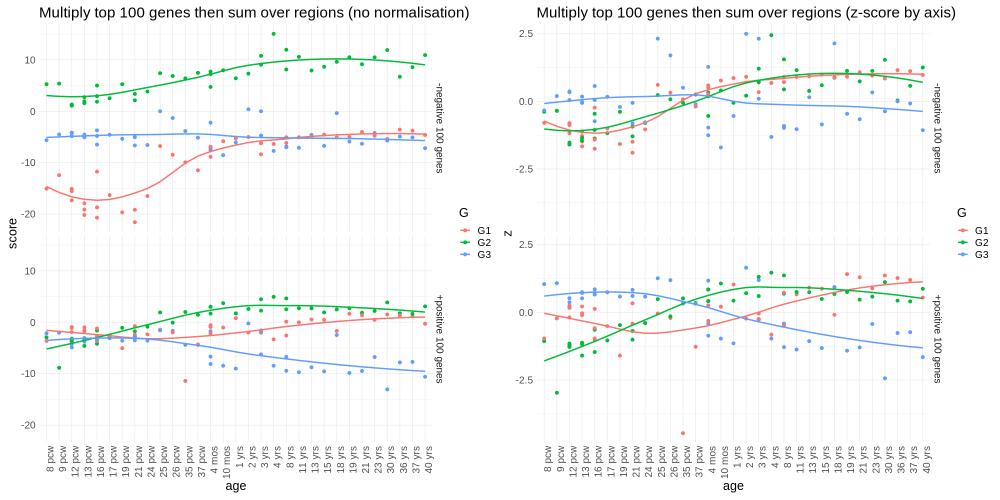

In [122]:
%%R -i bs_axes_by_age_donor_posneg -w 20 -h 10 --units in -r 100

g1 <- bs_axes_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes then sum over regions (no normalisation)')

g2 <- bs_axes_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes then sum over regions (z-score by axis)')

g1 + g2


### Top/bottom 100 genes - DLPFC only

In [207]:
bs_axes_DLPFC_by_age_donor_posneg = (
    bs_axes_by_region_age_donor_posneg.query("structure_name=='dorsolateral prefrontal cortex'")
    .set_index('posneg',append=True)
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby(['G','posneg'])['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_DLPFC_by_age_donor_posneg.head()

,donor_id,age,structure_name,posneg,G,score,z
0,13058,8 pcw,dorsolateral prefrontal cortex,+positive genes,G1,276.845635,-0.641695
140,13058,8 pcw,dorsolateral prefrontal cortex,+positive genes,G3,349.316381,1.177383
175,13058,8 pcw,dorsolateral prefrontal cortex,-negative genes,G3,-453.410125,0.860580
70,13058,8 pcw,dorsolateral prefrontal cortex,+positive genes,G2,619.120077,0.296004
105,13058,8 pcw,dorsolateral prefrontal cortex,-negative genes,G2,-271.060009,-0.100746


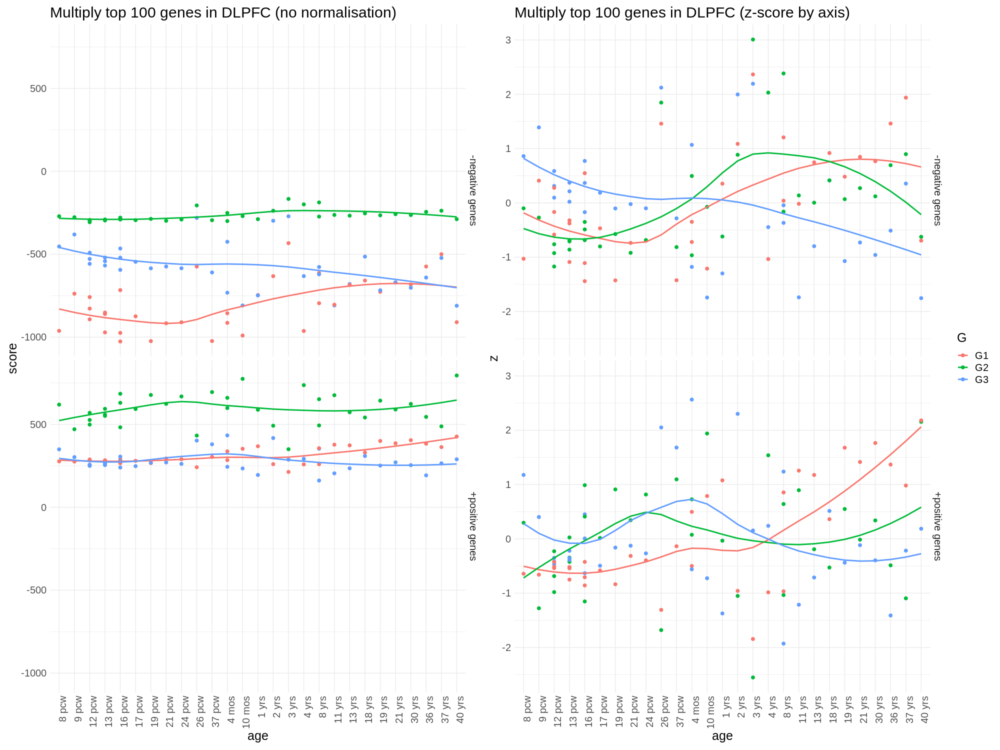

In [208]:
%%R -i bs_axes_DLPFC_by_age_donor_posneg -w 20 -h 15 --units in -r 100

g1 <- bs_axes_DLPFC_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in DLPFC (no normalisation)')

g2 <- bs_axes_DLPFC_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in DLPFC (z-score by axis)')

(g1 + g2) + plot_layout(guides='collect')


### Top/bottom 100 genes - Visual only

In [209]:
bs_axes_visual_by_age_donor_posneg = (
    bs_axes_by_region_age_donor_posneg.query("structure_name=='primary visual cortex (striate cortex, area V1/17)'")
    .set_index('posneg',append=True)
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby(['G','posneg'])['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_visual_by_age_donor_posneg.head()

,donor_id,age,structure_name,posneg,G,score,z
0,12835,12 pcw,"primary visual cortex (striate cortex, area V1...",+positive genes,G1,282.821578,-0.709168
165,12835,12 pcw,"primary visual cortex (striate cortex, area V1...",-negative genes,G3,-497.295522,0.355649
132,12835,12 pcw,"primary visual cortex (striate cortex, area V1...",+positive genes,G3,265.292475,-0.127128
133,12960,12 pcw,"primary visual cortex (striate cortex, area V1...",+positive genes,G3,263.603189,-0.157708
134,13060,12 pcw,"primary visual cortex (striate cortex, area V1...",+positive genes,G3,256.859045,-0.279791


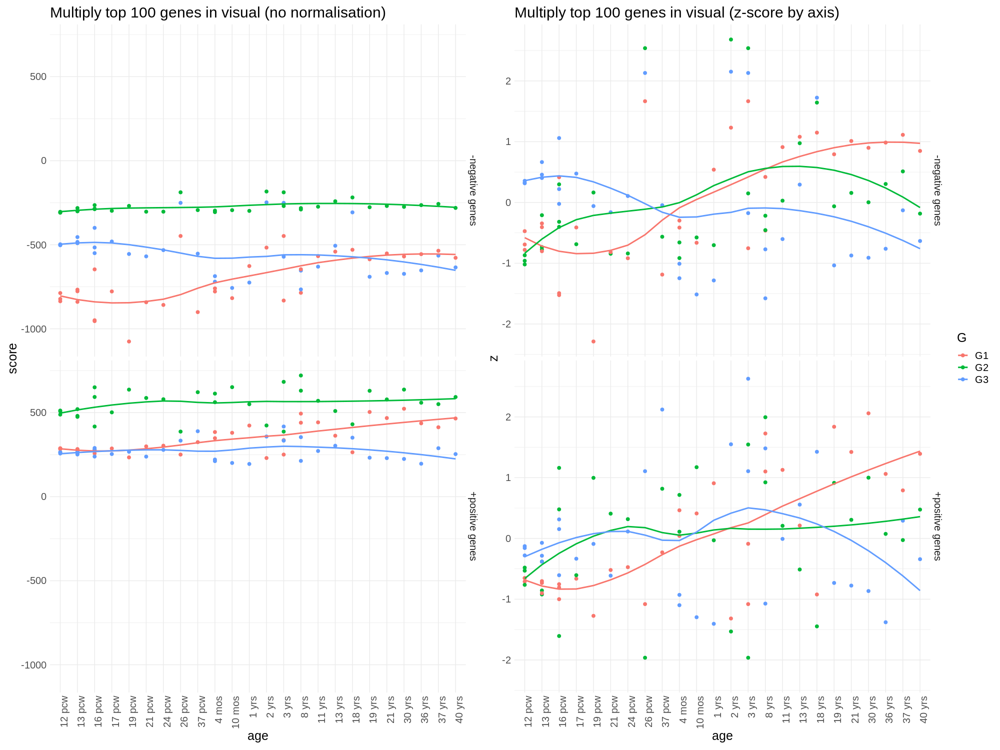

In [210]:
%%R -i bs_axes_visual_by_age_donor_posneg -w 20 -h 15 --units in -r 100

g1 <- bs_axes_visual_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in visual (no normalisation)')

g2 <- bs_axes_visual_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in visual (z-score by axis)')

(g1 + g2) + plot_layout(guides='collect')


### Top/bottom 100 genes - Somatosensory only

In [145]:
bs_axes_sm_by_age_donor_posneg = (
    bs_axes_by_region_age_donor_posneg.query("structure_name=='primary somatosensory cortex (area S1, areas 3,1,2)'")
    .set_index('posneg',append=True)
    .melt(ignore_index=False, var_name='G', value_name='score').reset_index()
    .assign(z = lambda x: x.groupby(['G','posneg'])['score'].apply(lambda y: (y-np.mean(y))/np.std(y)))
    .sort_values('age')
)
bs_axes_sm_by_age_donor_posneg.head()

,donor_id,age,structure_name,posneg,G,score,z
0,12835,12 pcw,"primary somatosensory cortex (area S1, areas 3...",+positive 100 genes,G1,-0.906794,-0.198986
27,12960,12 pcw,"primary somatosensory cortex (area S1, areas 3...",-negative 100 genes,G1,-16.486371,-1.165254
26,12835,12 pcw,"primary somatosensory cortex (area S1, areas 3...",-negative 100 genes,G1,-14.953579,-0.914273
52,12835,12 pcw,"primary somatosensory cortex (area S1, areas 3...",+positive 100 genes,G2,-3.238427,-1.390720
53,12960,12 pcw,"primary somatosensory cortex (area S1, areas 3...",+positive 100 genes,G2,-2.771609,-1.232489


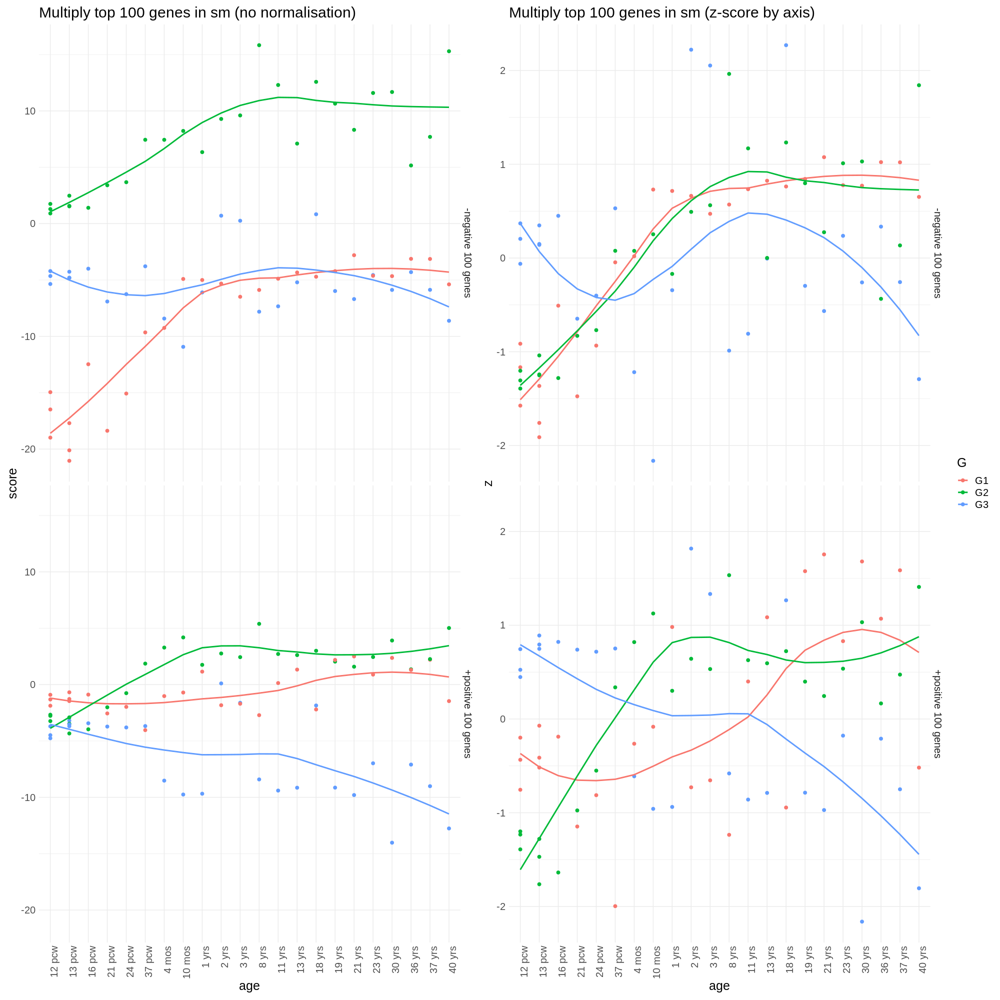

In [204]:
%%R -i bs_axes_sm_by_age_donor_posneg -w 20 -h 20 --units in -r 100

g1 <- bs_axes_sm_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=score, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in sm (no normalisation)')

g2 <- bs_axes_sm_by_age_donor_posneg %>% 
mutate_at(vars(age), ~ factor(., levels=unique(.))) %>%
ggplot(aes(x=age, y=z, color=G, group=G)) + geom_point(size=2) +
facet_grid(posneg~.) +
geom_smooth(se=F) +
theme_minimal() +
theme(text=element_text(size=18), axis.text.x=element_text(angle=90,hjust=1)) +
ggtitle('Multiply top 100 genes in sm (z-score by axis)')

(g1 + g2) + plot_layout(guides='collect')



In [38]:
bs_regions = bs_clean.groupby(['donor_id', 'age']).mean().dropna()
bs_regions.loc[:, matched_genes] @ weights.loc[matched_genes,:]

,,G1,G2,G3
donor_id,age,,,
12287,16 pcw,-687.662285,314.573020,-241.610482
12288,24 pcw,-646.293401,365.434429,-333.447037
12289,11 yrs,-371.839965,372.108945,-473.279214
12290,30 yrs,-278.122591,402.534104,-507.140745
12295,35 pcw,-635.393256,285.663671,-104.793046
12296,4 mos,-468.358892,302.296294,-440.397649
12298,4 yrs,-655.521650,484.785614,-334.343411
12299,15 yrs,-303.310860,314.322596,-498.265381
12300,23 yrs,-244.509105,318.087043,-213.137252


## Correlate with AHBA

PC corrs with no age groups

In [199]:
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=None)

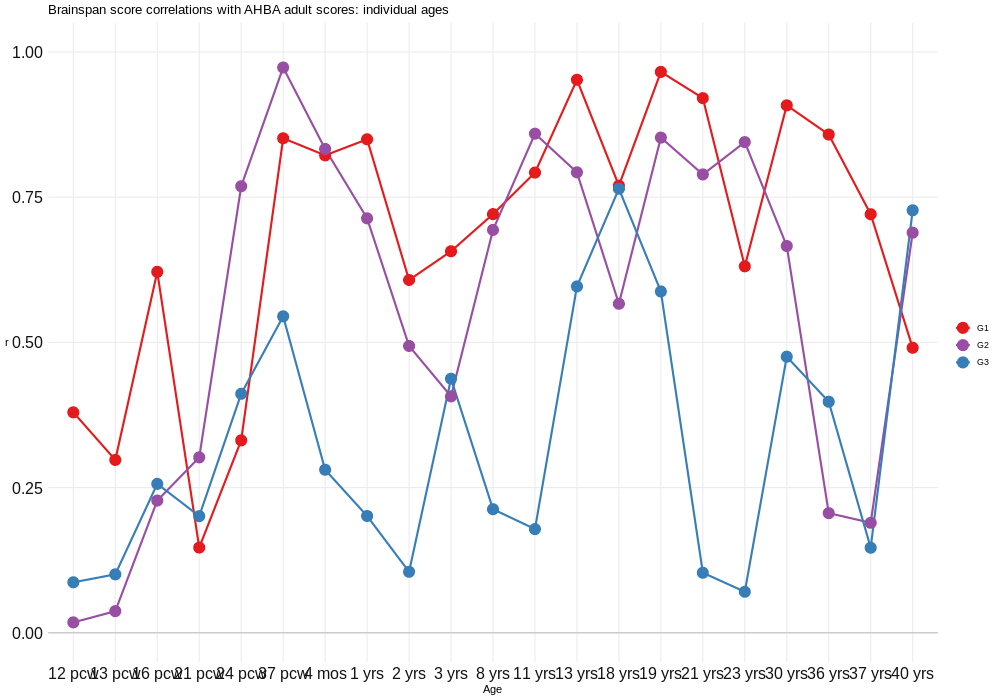

In [200]:
%%R -i bs_scores_corr -w 1000 -h 700
source("../code/brainspanPlots.R")
plot_bs_scores_corr(bs_scores_corr, title='Brainspan score correlations with AHBA adult scores: individual ages')

With age groupings

In [201]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

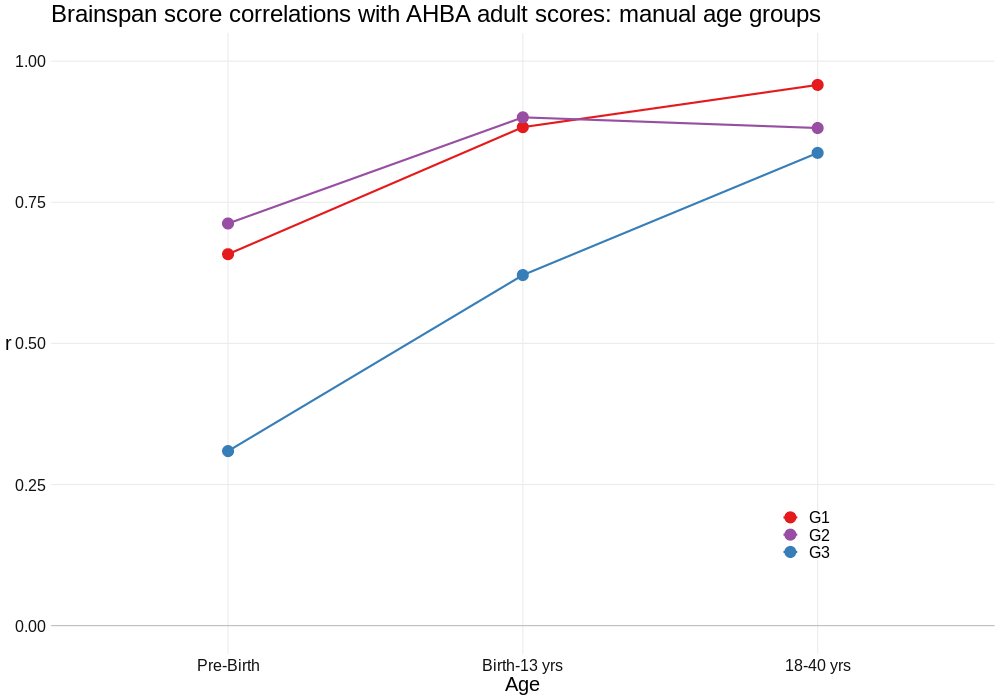

In [202]:
%%R -i bs_scores_corr -w 1000 -h 700
source("../code/brainspanPlots.R")
plot_bs_scores_corr(bs_scores_corr, title='Brainspan score correlations with AHBA adult scores: manual age groups', 
                 xint='Birth-3 yrs', rotate=F) + 
theme(text=element_text(size=20), legend.position=c(.8,.2))

In [203]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

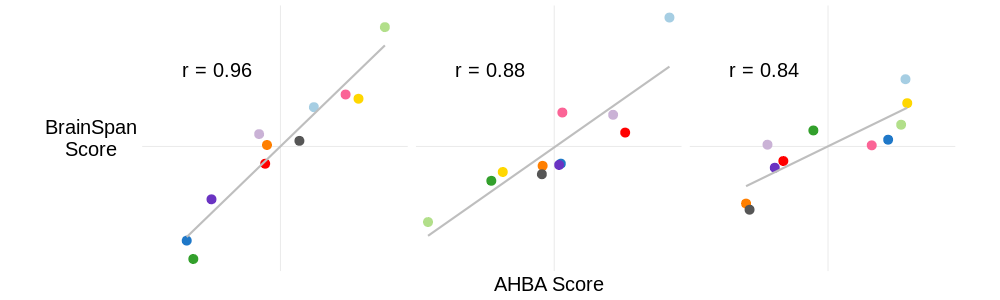

In [204]:
%%R -i both_scores -i both_corrs -w 1000 -h 300
source("../code/brainspanPlots.R")
plot_ahba_bs_scatter(both_scores, both_corrs)

In [205]:
scores_plot = make_brain_plots(version, hcp_bs_mapping, bs_scores)

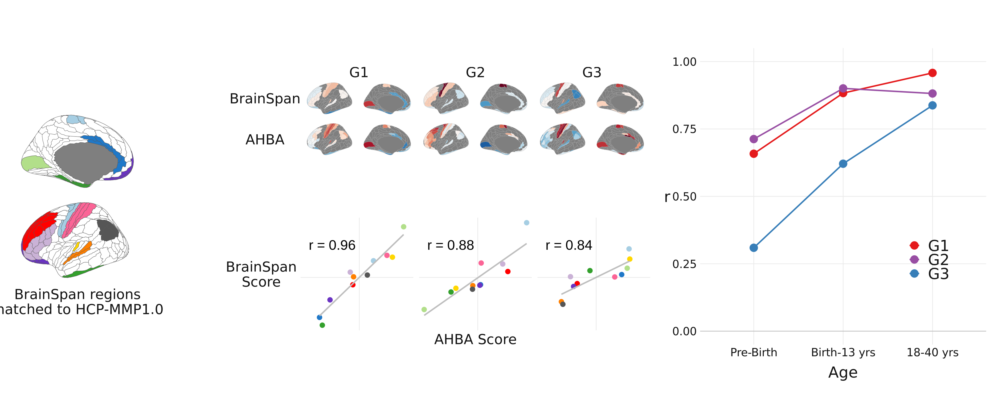

In [206]:
%%R -w 20 -h 8 --units in -r 200 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/brainspanPlots.R")
source("../code/brainPlots.R")

g10 <- plot_bs_hcp_mapping(hcp_bs_mapping, xlab='BrainSpan regions\nmatched to HCP-MMP1.0') + theme(plot.margin=margin(l=20), plot.tag.position=c(0,.95))
g11 <- plot_hcp(scores_plot, facet='v', switch='y') + theme(
            plot.tag.position = c(0.1, .9),
            strip.text.x=element_text(size=20), 
            strip.text.y.left=element_text(size=20, margin=margin(l=0)),
            legend.position='none'
            )
g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='h', size=3) + plot_layout(tag_level='new')
g13 <- plot_bs_scores_corr(bs_scores_corr) + 
    theme(legend.position=c(.8,.3), plot.tag.position = c(0, .95))

layout <- c(
    area(t=1,b=24,l=1,r=8),
    area(t=1,b=12,l=9,r=30),
    area(t=13,b=24,l=9,r=30),
    area(t=1,b=24,l=9,r=30),
    area(t=1,b=24,l=31,r=48)
)

plot <- g10 + g11 + g12 + plot_spacer() + g13 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
themed

In [207]:
age_groups = get_age_groups()

bs_pcs_corr_ds = {}
bs_pcs_corr_ds_points = {}
for ds, pcs in hcp_native_3donors_ds.items():
    _, pcs_cortex = get_mapped_pcs(pcs, hcp_native_base, hcp_bs_mapping)
    bs_pcs = compute_brainspan_pc_scores(bs_agg, pcs, bs_cortex_mapping)
    bs_pcs_corr_ds[ds] = correlate_bs_pcs(bs_pcs, pcs_cortex, age_groups=age_groups)
    bs_pcs_corr_ds_points[ds] = (correlate_bs_pcs(bs_pcs, pcs_cortex)
                                 .assign(age = lambda x: x['age'].map(age_groups))
                                )
    
bs_pcs_corr_ds_plot = (pd.concat(bs_pcs_corr_ds).reset_index(0)
                       .rename({'level_0':'DS_filter'},axis=1))

bs_pcs_corr_ds_points_plot = (pd.concat(bs_pcs_corr_ds_points).reset_index(0)
                       .rename({'level_0':'DS_filter'},axis=1))

NameError: name 'hcp_native_3donors_ds' is not defined

In [2310]:
bs_pcs_corr_ds_points_plot.head()

,DS_filter,age,PC,corr
0,DS 0.5,12-13 pcw,PC1,0.559700
1,DS 0.5,12-13 pcw,PC1,0.552211
2,DS 0.5,16-19 pcw,PC1,0.747131
3,DS 0.5,16-19 pcw,PC1,0.546249
4,DS 0.5,16-19 pcw,PC1,0.685607


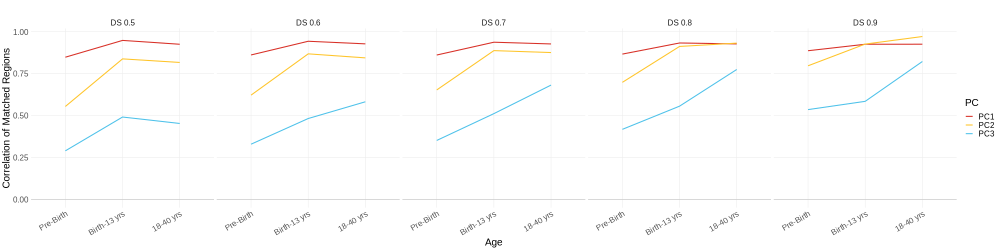

In [2322]:
%%R -i bs_pcs_corr_ds_plot -i bs_pcs_corr_ds_points_plot -w 2000 -h 500
source("../code/brainspanPlots.R")
plot_bs_pcs_corr(bs_pcs_corr_ds_plot, xint='Birth-3 yrs', rotate=T) + 
facet_grid(.~DS_filter) + 
# geom_point(data=bs_pcs_corr_ds_points_plot, aes(x=age, y=corr, color=PC, group=PC), 
#           position=position_dodge(.3)) +
# geom_smooth(data=bs_pcs_corr_ds_points_plot, method='lm', span = 2,
            # aes(x=age, y=corr, color=PC, group=PC), size=1, se=F) + 
theme(text=element_text(size=20), axis.text.x=element_text(size=16, hjust=1))

In [2303]:
correlate_bs_pcs(bs_pcs, pcs_cortex, age_groups=age_groups, plot=False)

,PC1,PC2,PC3
age,,,
12-13 pcw,0.689329,0.481033,-0.157807
16-19 pcw,0.805880,0.685270,0.544313
21-37 pcw,0.762683,0.902235,0.388235
Birth-3 yrs,0.870293,0.821641,0.519370
8-13 yrs,0.934924,0.828597,0.593929
18-40 yrs,0.907381,0.911952,0.860903


With rolling window 3

In [1612]:
bs_pcs_corr = correlate_bs_pcs(bs_pcs, pcs_cortex, rolling=3)

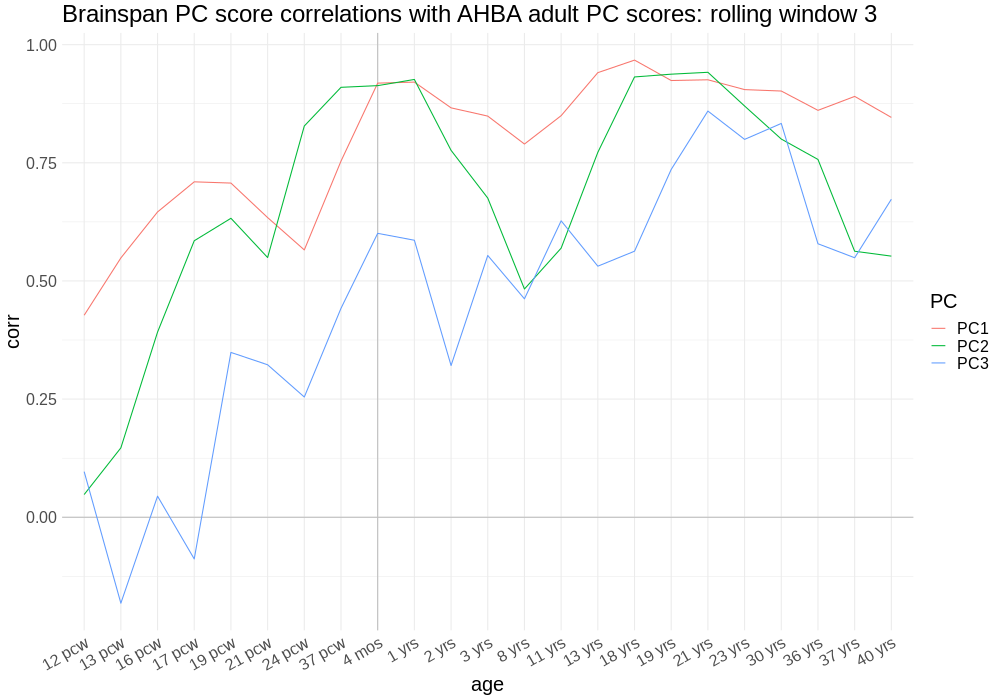

In [1613]:
%%R -i bs_pcs_corr -w 1000 -h 700
plot_bs_pcs_corr(bs_pcs_corr, title='Brainspan PC score correlations with AHBA adult PC scores: rolling window 3')

In [1614]:
bs_pcs_corr = correlate_bs_pcs(bs_pcs, pcs_cortex, rolling=6)

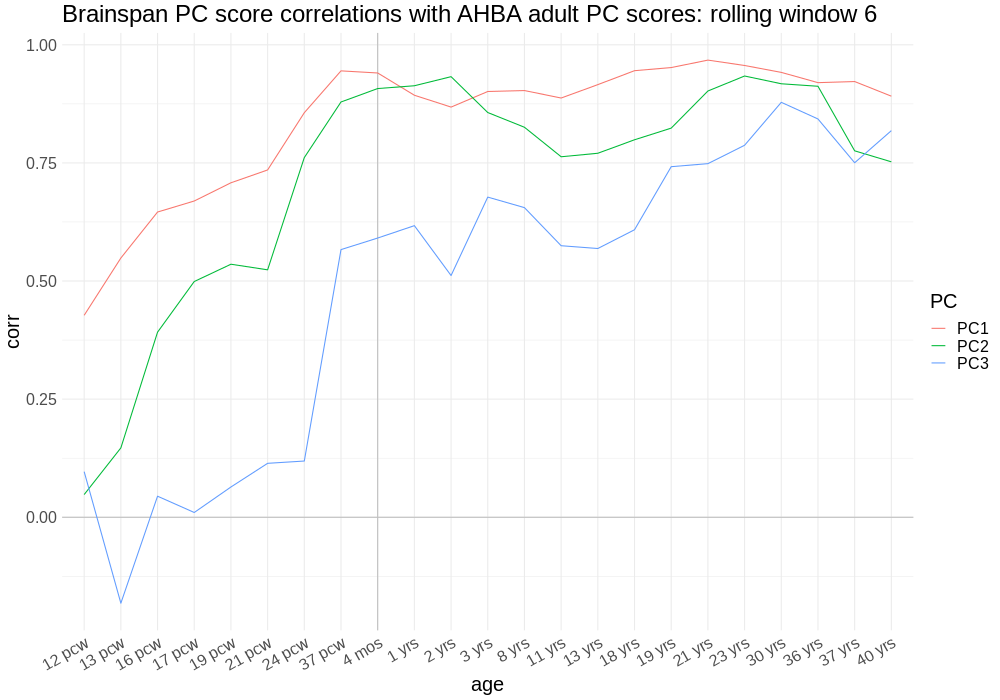

In [1615]:
%%R -i bs_pcs_corr -w 1000 -h 700
plot_bs_pcs_corr(bs_pcs_corr, title='Brainspan PC score correlations with AHBA adult PC scores: rolling window 6')

## Do PCA in Brainspan directly

In [370]:
bs_adults = (bs_clean
 .reset_index()
 .assign(age_group = lambda x: x['age'].map(age_groups))
 .set_index(['age_group', 'structure_name']).drop(['age'],axis=1)
 .loc['18-40 yrs', :]
 .set_index('donor_id', append=True)
 # .groupby(['structure_name']).mean()
)
bs_adults.head()

,gene_symbol,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,C1orf201,NIPAL3,LAS1L,ENPP4,SEMA3F,ANKIB1,CYP51A1,KRIT1,RAD52,BAD,LAP3,HS3ST1,HECW1,MAD1L1,LASP1,SNX11,M6PR,KLHL13,CYP26B1,ICA1,DBNDD1,ALS2,CASP10,CFLAR,TFPI,C2orf56,RBM5,MTMR7,ARF5,SARM1,POLDIP2,PLXND1,AK2,FKBP4,KDM1A,RBM6,CAMKK1,RECQL,CCDC132,ARHGAP33,NDUFAB1,PDK4,ZMYND10,ARX,SLC25A13,ST7,CDC27,HCCS,DVL2,UPF1,SKAP2,SLC25A5,CCDC109B,POLR2J,DHX33,THSD7A,LIG3,RPAP3,ACSM3,AC004381.6,CIAPIN1,AC004410.1,KIAA1539,PRKAR2B,MSL3,CREBBP,BZRAP1,C2orf3,WDR54,CROT,MLL5,RHBDD2,SOX8,IBTK,ZNF195,MYCBP2,FBXL3,PDK2,ITGA3,ZFX,LAMP2,GGNBP2,ITGA2B,GDE1,C19orf60,OSBPL7,TMEM98,YBX2,MAP3K14,ABCC8,SYNRG,CACNG3,TMEM132A,AP2B1,TAC1,ZNF263,CX3CL1,SPATA20,CACNA1G,DLX6,MAP3K9,RALA,JHDM1D,ETV1,AGK,PHTF2,FARP2,GGCT,DBF4,TBXA2R,IFRD1,COX10,GTF2IRD1,PAF1,VPS41,ARHGAP44,ELAC2,ARSD,PNPLA4,ADIPOR2,CDKL3,UPP2,MARK4,PROM1,CCDC124,PAFAH1B1,NOS2,DNAH9,KIAA0100,GAS7,TRAPPC6A,MATK,ST7L,PAX6,RPUSD1,RHBDF1,LUC7L,CACNA2D2,BAIAP3,C16orf42,PIGQ,CRAMP1L,DNAJC11,MYLIP,PSMB1,SYN1,JARID2,CDKL5,CAMK1G,CDK11A,NADK,DLEC1,CYTH3,ADAM22,SYPL1,CYB561,SPAG9,CELSR3,AASS,SS18L2,MPND,MGST1,CRY1,NFIX,ST3GAL1,MMP25,IL32,PKD1,MAPK8IP2,MED24,RHOBTB2,HEATR5B,SEC62,RPS20,CSDE1,UBE3C,REV3L,ODZ1,MASP2,FAM76A,POMT2,VTA1,BAZ1B,RANBP9,C1orf124,METTL13,DYRK4,ZNF207,UQCRC1,STARD3NL,CD9,NCAPD2,IFFO1,PHF7,SEMA3G,NISCH,STAB1,FUZ,IDS,ZNF200,CD4,LRRC23,SCMH1,FYN,HIVEP2,TCEB3,LYPLA2,CLCN6,MRC2,NME2,SLC6A7,TSPAN9,BTBD7,APBA3,MKS1,ABHD5,KAL1,AKAP8L,MBTD1,UTP18,RNF216,TTC19,PTBP1,DPF1,SYT7,LARS2,PIK3C2A,PLAUR,ANLN,WIZ,RABGAP1,DCN,QPCTL,PPP5C,CEP68,MAP4K3,TMEM159,GABRA3,BRCA1,ERCC1,SEMA3B,...,RP11-386G11.10,RP11-350G24.2,AC025263.3,RP11-644F5.11,RP11-70F11.6,RP11-293I14.2,RP11-554D14.2,RP11-734E19.1,RP4-816N1.7,RP11-43D4.2,MKRN9P,RP11-511H9.4,RP11-588H23.3,NKX2-2-AS1,RP11-977G19.5,RP11-478C19.2,RP11-161H23.5,OSTF1P1,RP11-977G19.14,RP11-693J15.3,RP11-386G11.3,CHURC1,RP11-658F2.8,RP11-317N8.2,RP11-488C13.5,RP11-644F5.10,RP11-603J24.5,RP11-274M17.1,RP11-778J16.2,RP1-128M12.1,RP11-649E7.5,RP11-517O13.1,AC068831.6,XXbac-BPG300A18.12,ZNF578,RP11-195F19.30,RP11-471B22.2,CTD-2568P8.3,PDF,RP11-982M15.2,CTD-2552B11.4,RP11-307P22.1,RP11-247L20.2,RP11-164J13.1,RP11-574F21.3,RP11-1012A1.4,RP11-665C16.4,RP11-84C10.4,RP11-192H23.4,RN7SL1,RP11-705B14.1,RP11-638I2.6,RP11-857B24.3,RP11-363J20.2,RP11-829H16.3,RP11-108O10.8,RP11-12J10.3,RP11-463C8.5,KB-1896H10.1,RP11-998D10.2,RP11-638I2.10,RP11-316E14.2,RP11-371E8.2,CTD-2576F9.1,RP11-299L17.4,RP11-35B20.1,RP11-488C13.7,RP4-773N10.4,BCL2L2-PABPN1,RP11-718G2.3,CTD-2302E22.3,RP11-950C14.3,RP11-517O13.2,RP5-1021I20.4,RP11-431H16.2,RP11-193F5.4,RP4-693M11.3,RP11-638I2.8,CTC-260F20.3,RP11-463D19.2,RP4-773N10.5,RP11-433J8.1,RP11-537P22.1,RP11-998D10.7,CTD-2135J3.4,AC068831.8,RP11-66N24.3,RP11-195F19.29,RP11-112J1.3,RP11-386M24.4,RP11-688G15.3,RP11-361H10.2,RP11-841O20.2,RP11-24J19.1,CTD-2292M16.2,RAP1AP,RP11-618G20.4,RP11-701B16.2,RP11-561B11.2,CTD-2302E22.2,RP11-109N23.4,CTD-2555O16.2,RP11-123K3.4,RP11-123B3.6,MC1R,CTC-554D6.1,AC007040.11,RP11-718G2.4,CEP95,RP5-1021I20.5,CTD-2643K12.1,HNRPCP,RP11-644F5.15,RP11-203M5.8,RP11-33N16.1,CTB-96E2.3,RP11-317N8.5,RP11-407N17.3,RP11-566K11.2,RP4-776F14.3,AC004507.1,RP11-442G21.1,RP11-1017G21.4,RP11-618G20.1,RHOXF2,COX5AP2,RP11-526L8.1,TMEM179,RP11-125H8.1,RP11-47I22.4,RP11-463J10.3,RP11-124D2.3,RP11-561B11.4,FAM18B2-CDRT4,RP11-361H10.4,RP11-653A5.2,CTD-2062F14.3,RP11-406A9.1,MUTED-TXNDC5,RP11-589M4.1,RP11-736L22.1,AL157871.2,RP11-33N16.3,RP11-371E8.4,RP11-247L20.4,POC1B-GALNT4,CTD-2509G16.6,RP1-261D10.1,RP11-158I13.2,RP11-488C13.6,RP11-134E15.2,RP11-173D9.5,RP11-1112J20.2,RP11-804L24.1,CTD-2552B11.2,NDUFC2-KCTD14,AC005484.5,CTD-2540L5.5,RP11-840I19.3,AC093510.2,RP11-298I3.5,RP11-1085N6.3,RP11-305B6.1,AC027323.1,RP11-903H12.2,RP11-334E6.11,RP11-1078H9.5,RP11-463C8.4,DDX18P1,RP11-100M12.3,AL163636.6,RP11-299G20.2,RP11-379K22.2,RP11-56B16.4,ITGB3,RP11-64K12.8,RP11-227D13.2,RP11-702L15.2,RP11-17L5.4,RP11-265M18.2,CTD-3094K11.2,AL138781.2,RP11-133K1.2,RP11-617F23.1,RP11-150L8.2,RP11-562A

Normalize, filter DS, aggregate

In [371]:
# bs_adults_norm = (bs_adults
#                   # .apply(lambda x: (x-np.mean(x))/np.std(x), axis=1) # normalize each sample across genes
#                   .groupby('donor_id').transform(lambda x: (x-np.mean(x))/np.std(x)) # normalize each gene across samples, within each donor
#                  )
# donors = bs_adults_norm.index.get_level_values(1).unique()
# bs_adults_list = [bs_adults_norm.xs(donor, level=1) for donor in donors]

# bs_adults_norm = (bs_adults
#                   # .apply(lambda x: (x-np.mean(x))/np.std(x), axis=1) # normalize each sample across genes
#                   .groupby('donor_id').transform(lambda x: (x-np.mean(x))/np.std(x)) # normalize each gene across samples, within each donor
#                  )

donors = bs_adults.index.get_level_values(1).unique()
# sample norm
# bs_adults_sample_norm = bs_adults.transform(lambda x: (x-np.mean(x))/np.std(x), axis=1)
# bs_adults_list = [bs_adults_sample_norm.xs(donor, level=1) for donor in donors]

bs_adults_list = [bs_adults.xs(donor, level=1) for donor in donors]
bs_adults_norm_list = [exp.transform(lambda x: (x-np.mean(x))/np.std(x)) for exp in bs_adults_list]

bs_adults_filter_ds_list, stability = abagen.keep_stable_genes(bs_adults_norm_list, threshold=.8, return_stability=True)
bs_adults_agg = pd.concat(bs_adults_filter_ds_list).groupby('structure_name').mean()

NameError: name 'pcaVersion' is not defined

In [377]:
bs_pca = gradientVersion(approach='pca', marker_genes=[]).fit(bs_adults_agg)

New gradients version: method=pca, kernel=None, sparsity=0, data=


Do PCA

Get scores by cortex (normalize again for plotting)

In [2184]:
version = dm_hcp_ds9
# pc_version = hcp_base
_, scores_cortex = get_mapped_scores(pc_version, hcp_native_base, hcp_bs_mapping)
gene_mask = version.coefs.columns.intersection(bs_adult.columns)

bs_adult_mask = (bs_adults.loc[:, gene_mask]
                 .groupby('donor_id').transform(lambda x: (x-np.mean(x))/np.std(x)) # normalize
                 .groupby('structure_name').mean() # aggregate
                )
bs_pca = pcaVersion(bs_adult_mask)

New PCA version


In [379]:
bs_pca_cortex_scores = (bs_pca.scores
 .apply(lambda x: (x-np.mean(x))/np.std(x))
 .reset_index()
 .assign(cortex = lambda x: x['structure_name'].map(bs_cortex_mapping))
 .set_index('cortex').drop('structure_name', axis=1)
 # .groupby('cortex').mean()
)
bs_pca_cortex_scores

,0,1,2,3,4
cortex,,,,,
Anterior_Cingulate_and_Medial_Prefrontal,1.137147,-0.168296,-0.770995,2.249619,1.566882
Dorsolateral_Prefrontal,1.084106,0.420377,2.046467,-1.318415,1.335848
Lateral_Temporal,2.029984,1.009308,-1.469473,-0.981916,-1.166345
Orbital_and_Polar_Frontal,0.444750,-0.720787,0.828077,0.741711,-0.592260
Auditory_Association,-0.375541,-0.712922,0.026966,0.425291,-1.377362
Inferior_Parietal,-0.137183,-0.423370,0.880607,-0.062134,-0.760856
Early_Auditory,-0.569191,-0.171534,-0.254526,-0.153616,-0.697778
Motor,-0.947365,-0.748850,-1.437341,-1.355138,1.390750
Somatosensory,-0.848495,-0.138455,-0.497110,-0.389035,0.379189


In [378]:
correlate(bs_pca.weights, version.weights)

,0,1,2,3,4
0,-0.909706,-0.239575,-0.057461,-0.295394,0.102050
1,0.363287,-0.354804,0.073190,0.065483,-0.074729
2,0.003865,-0.180111,-0.441021,0.126079,-0.057174
3,0.184923,0.199657,0.034707,-0.005846,0.234092
4,0.052624,0.522767,0.296643,0.064328,-0.142372


In [381]:
correlate(bs_pca_cortex_scores, scores_cortex)

,0,1,2,3,4
0,-0.811462,0.200234,-0.557447,0.266447,-0.306011
1,0.384562,-0.658199,0.391620,-0.282720,0.661053
2,-0.020996,0.114087,-0.450030,-0.304670,0.299691
3,-0.315621,-0.336457,-0.078039,-0.305177,0.419256
4,0.153638,0.583557,0.494026,0.044970,0.275780


In [2188]:
bs_pca.corr_scores(pc_version, base=hcp_base)

,0,1,2,3,4
0,0.998751,-0.055095,-0.001865,0.073116,-0.027916
1,-0.584282,0.631953,0.210300,-0.100996,-0.170436
2,-0.272096,-0.462636,0.821436,0.165196,-0.176190
3,0.037071,-0.829424,-0.338997,-0.100385,-0.116015
4,-0.215235,-0.456555,0.220372,0.578317,0.458263


In [2189]:
bs_pcs_hcp = bs_pca_cortex_scores.join(hcp_bs_mapping.set_index('cortex')['region']).rename(columns={'region':'label'}).assign(version=1)
bs_ahba_corr = correlate(pcs_cortex, bs_pca_cortex_scores).stack().reset_index().set_axis(['x','y','corr'],axis=1).assign(version=1)

From gene projection

In [2215]:
bs_pcs_project = (bs_pcs
 .reset_index().assign(age_groups=lambda x: x['age'].map(age_groups)).set_index(['age_groups', 'cortex']).loc['18-40 yrs'].groupby('cortex').mean()
                 )
bs_ahba_corr = correlate(pcs_cortex, bs_pcs_project).stack().reset_index().set_axis(['x','y','corr'],axis=1).assign(version=1)

In [2174]:
cortex_scores_combined = pd.concat({
    'AHBA_mean': pcs_cortex.iloc[:,:3].set_axis(['PC1','PC2','PC3'], axis=1), 
    'Brainspan': bs_pca_cortex_scores.iloc[:, [0,2,3]].set_axis(['PC1','PC2','PC3'], axis=1)
}, axis=1).stack(level=1).reset_index().rename({'level_1':'PC'}, axis=1)
cortex_scores_combined.head()

,cortex,PC,AHBA_mean,Brainspan
0,Anterior_Cingulate_and_Medial_Prefrontal,PC1,-1.390917,1.223194
1,Anterior_Cingulate_and_Medial_Prefrontal,PC2,-0.501206,0.587497
2,Anterior_Cingulate_and_Medial_Prefrontal,PC3,0.474223,-1.113752
3,Auditory_Association,PC1,-0.944514,-0.237841
4,Auditory_Association,PC2,0.758306,-0.817108


Save for paper

In [2090]:
pcs_cortex.to_csv('../outputs/ahba_cortex_scores.csv')
bs_pca_cortex_scores.to_csv('../outputs/brainspan_cortex_scores.csv')
hcp_bs_mapping.to_csv('../outputs/hcp_bs_mapping.csv')
cortex_scores_combined.to_csv('../outputs/cortex_scores_combined.csv')
bs_ahba_corr.to_csv("../outputs/bs_ahba_corr.csv")

In [ ]:
cortex_scores_combined.groupby('PC').apply(lambda x: x.corr()).loc[(slice(None), 'AHBA_mean'), 'Brainspan']

PC            
PC1  AHBA_mean    0.910206
PC2  AHBA_mean    0.657138
PC3  AHBA_mean   -0.593310
Name: Brainspan, dtype: float64

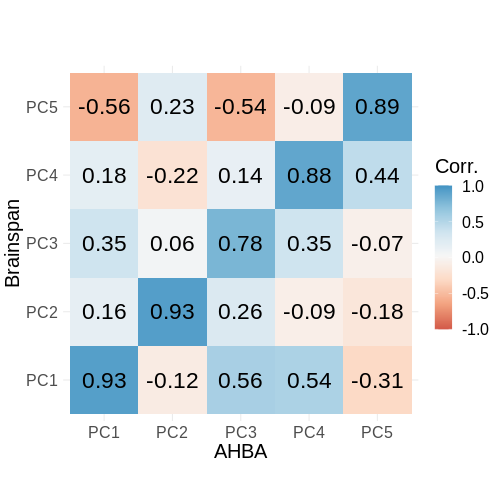

In [2216]:
%%R -i bs_pcs_hcp -i bs_ahba_corr -i cortex_scores_combined -i corrs -w 500 -h 500
source("../code/brainspanPlots.R")
# plot_hcp(bs_pca_hcp)
plot_corrs(bs_ahba_corr, xlab='AHBA', ylab='Brainspan') + theme(strip.text.x = element_blank(), text=element_text(size=20))
# plot_bs_scatter_for_ohbm(cortex_scores_combined, corrs)

---

# OLD

---

## Explore brainspan

Expression matrix:

In [7]:
bs_exp.head()

,1,2,3,4,5,6,7,8,9,10,...,515,516,517,518,519,520,521,522,523,524
0,,,,,,,,,,,,,,,,,,,,,
1,36.447128,24.251253,19.330479,27.668607,19.998231,14.680673,27.548101,16.580183,44.587799,44.943915,...,2.320932,1.781548,2.277359,1.832737,1.555696,2.081944,3.484685,4.816781,3.034464,3.082820
2,0.044081,0.067338,0.000000,0.145466,0.185188,0.311180,0.000000,0.000000,0.473831,0.181220,...,0.758571,0.000000,0.061869,0.026876,0.100691,0.140675,0.300576,0.126526,0.000000,0.424134
3,34.373239,20.765661,18.734947,22.366394,19.228431,11.020365,25.394607,17.671327,32.903100,38.157569,...,23.769167,20.142132,20.063257,16.575379,18.783516,21.631293,28.006120,28.731717,16.679597,28.866042
4,4.379337,4.227521,2.551825,3.603764,2.948976,2.405183,3.613642,2.573935,3.483817,3.609830,...,1.593009,1.563377,1.648571,2.231466,2.040326,2.161741,1.275352,1.184766,1.735579,1.500363
5,3.957119,3.520794,2.037805,3.487035,2.177235,0.999693,3.481555,1.747568,3.741580,3.560650,...,0.583488,0.797376,0.607141,0.575555,0.606445,0.683625,0.495084,0.761265,0.766482,0.468859


Column labels for each sample, from different donors:

In [8]:
bs_col.head()

,column_num,donor_id,donor_name,age,gender,structure_id,structure_acronym,structure_name
0,1,13058,H376.IIA.51,8 pcw,M,10268,Ocx,occipital neocortex
1,2,13058,H376.IIA.51,8 pcw,M,10291,M1C-S1C,primary motor-sensory cortex (samples)
2,3,13058,H376.IIA.51,8 pcw,M,10361,AMY,amygdaloid complex
3,4,13058,H376.IIA.51,8 pcw,M,10550,MGE,medial ganglionic eminence
4,5,13058,H376.IIA.51,8 pcw,M,10243,STC,posterior (caudal) superior temporal cortex (a...


Row labels for each gene:

In [9]:
bs_row.head()

,row_num,gene_id,ensembl_gene_id,gene_symbol,entrez_id
0,1,7062.0,ENSG00000000003,TSPAN6,7105.0
1,2,40735.0,ENSG00000000005,TNMD,64102.0
2,3,8736.0,ENSG00000000419,DPM1,8813.0
3,4,36423.0,ENSG00000000457,SCYL3,57147.0
4,5,35021.0,ENSG00000000460,C1orf112,55732.0


Define age groups

In [165]:
age_groups = get_age_groups()

bs_col = (bs_col 
          .assign(age_group = lambda x: x['age'].map(age_groups))
          .assign(age_group = lambda x: pd.Categorical(x['age_group'], ordered=True, categories=x['age_group'].unique()))
         )

Check how many donors we have in each age group (just for samples from DFC)

In [178]:
(bs_col
#  .loc[lambda x: x['structure_acronym']=='DFC']
#  .groupby(['age']).agg({'donor_id':'count'})
#  .rename({'donor_id':'donor_count'},axis=1)
.assign(region = lambda x: x['structure_name'].map(get_short_bs_names()))
.pivot_table(values='column_num', index='region', columns='age_group', aggfunc='count')
#  .sort_values(list(bs_col['age_group'].cat.categories)[::-1], axis=0, ascending=False)
)

age_group,Pre-Birth,Birth-13 yrs,18-40 yrs
region,,,
dorsolateral prefrontal cortex,17,11,7
inferior parietal cortex,14,11,8
inferolateral temporal cortex,13,13,8
medial prefrontal cortex,15,10,7
orbital frontal cortex,14,9,8
posterior superior temporal cortex,14,14,8
primary auditory cortex,14,9,8
primary motor cortex,10,8,8
primary somatosensory cortex,10,8,8


Check full table of samples from each brain region x age group

In [252]:
pd.set_option('display.max_columns', 50)
(bs_col
 .pivot_table(values='column_num', index='structure_name', columns='age_group', aggfunc='count')
 .sort_values(list(bs_col['age_group'].cat.categories)[::-1], axis=0, ascending=False)
)

age_group,8-12 pcw,13 pcw,16-20 pcw,20-38 pcw,Birth-1 yr,2-5 yrs,6-11 yrs,12-19 yrs,20-40 yrs
structure_name,,,,,,,,,
posterior (caudal) superior temporal cortex (area 22c),3,2,5,4,5,4,3,4,6
cerebellar cortex,1,0,2,5,4,4,3,4,6
"inferolateral temporal cortex (area TEv, area 20)",4,3,2,4,5,3,3,4,6
posteroventral (inferior) parietal cortex,3,3,5,3,3,3,3,4,6
ventrolateral prefrontal cortex,4,3,5,4,3,4,3,3,6
amygdaloid complex,5,3,3,3,4,3,3,3,6
primary auditory cortex (core),3,3,5,3,3,2,3,3,6
hippocampus (hippocampal formation),5,3,4,3,3,2,3,3,6
orbital frontal cortex,5,3,3,3,4,2,2,3,6


## Map HCP regions to Brainspan

Map the BS regions to HCP 'cortex' (grouping of regions)

In [559]:
bs_hcp_map = {
    'primary visual cortex (striate cortex, area V1/17)': 'Primary_Visual',
    'posteroventral (inferior) parietal cortex': 'Inferior_Parietal',
    'primary somatosensory cortex (area S1, areas 3,1,2)': 'Somatosensory_and_Motor',
    'primary motor cortex (area M1, area 4)': 'Somatosensory_and_Motor',
    'dorsolateral prefrontal cortex': 'Dorsolateral_Prefrontal',
    'ventrolateral prefrontal cortex': 'Inferior_Frontal',    
    'anterior (rostral) cingulate (medial prefrontal) cortex': 'Anterior_Cingulate_and_Medial_Prefrontal',
    'orbital frontal cortex': 'Orbital_and_Polar_Frontal',
    'inferolateral temporal cortex (area TEv, area 20)': 'Lateral_Temporal',
    'primary auditory cortex (core)': 'Early_Auditory',
    'posterior (caudal) superior temporal cortex (area 22c)': 'Auditory_Association'
}

bs_col_hcp = bs_col.assign(hcp_cortex = lambda x: x['structure_name'].map(bs_hcp_map)).set_index('column_num')
bs_col_hcp.loc[lambda x: x['hcp_cortex'].notnull()].head()

,donor_id,donor_name,age,gender,structure_id,structure_acronym,structure_name,age_group,hcp_cortex
column_num,,,,,,,,,
5,13058,H376.IIA.51,8 pcw,M,10243,STC,posterior (caudal) superior temporal cortex (a...,8-12 pcw,Auditory_Association
9,13058,H376.IIA.51,8 pcw,M,10278,MFC,anterior (rostral) cingulate (medial prefronta...,8-12 pcw,Anterior_Cingulate_and_Medial_Prefrontal
10,13058,H376.IIA.51,8 pcw,M,10173,DFC,dorsolateral prefrontal cortex,8-12 pcw,Dorsolateral_Prefrontal
11,13058,H376.IIA.51,8 pcw,M,10194,OFC,orbital frontal cortex,8-12 pcw,Orbital_and_Polar_Frontal
13,13058,H376.IIA.51,8 pcw,M,10252,ITC,"inferolateral temporal cortex (area TEv, area 20)",8-12 pcw,Lateral_Temporal


Map BS regions with HCP cortex to all HCP regions

,region,cortex
0,V1,Primary_Visual
1,MST,MT+_Complex_and_Neighboring_Visual_Areas
2,V6,Dorsal_Stream_Visual
3,V2,Early_Visual
4,V3,Early_Visual
...,...,...
175,STSva,Auditory_Association
176,TE1m,Lateral_Temporal
177,PI,Insular_and_Frontal_Opercular
178,a32pr,Anterior_Cingulate_and_Medial_Prefrontal


In [638]:
# Read HCP info file
hcp_info = pd.read_csv("../data/HCP-MMP1_UniqueRegionList.txt")
# Explode BS regions to all HCP regions
hcp_bs = (hcp_info
          .join(bs_col_hcp.set_index('hcp_cortex')['structure_name'], on='cortex').drop_duplicates()
          .loc[:180, ['region', 'cortex', 'structure_name']]
         )
hcp_bs.head()

,region,cortex,structure_name
0,V1,Primary_Visual,"primary visual cortex (striate cortex, area V1..."
1,MST,MT+_Complex_and_Neighboring_Visual_Areas,NaN
2,V6,Dorsal_Stream_Visual,NaN
3,V2,Early_Visual,NaN
4,V3,Early_Visual,NaN


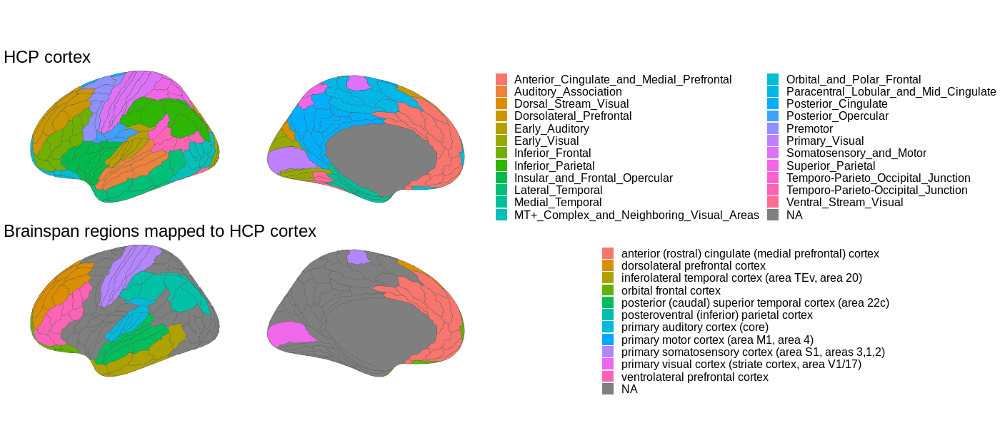

In [639]:
%%R -i hcp_bs -w 1400 -h 600
library(pals)

glasser$data <- glasser$data %>% filter(hemi=='left')
# ix_matches <- match(hcp_bs$hcp_cortex %>% unique() %>% sort(), hcp_info$cortex %>% unique() %>% sort())
# palette_all <- as.vector(polychrome(23))
# palette_matched <- palette_all[ix_matches]

g0 <- ggplot(hcp_bs) + 
geom_brain(atlas=glasser, mapping=aes(fill=cortex, geometry=geometry, hemi=hemi, side=side, type=type)) +
guides(fill=guide_legend('')) +
theme_void() + ggtitle('HCP cortex') + theme(text=element_text(size=20), plot.title=element_text(vjust=-1))

g1 <- ggplot(hcp_bs) + 
geom_brain(atlas=glasser, mapping=aes(fill=structure_name, geometry=geometry, hemi=hemi, side=side, type=type)) +
guides(fill=guide_legend('')) +
theme_void() + ggtitle('Brainspan regions mapped to HCP cortex') + theme(text=element_text(size=20), plot.title=element_text(vjust=-1))

g0/g1

## Clean, normalize, and aggregate Brainspan adult data

In [26]:
# First join the sample data and select only adults
bs_adult = (pd.concat([
    bs_exp.T,
    bs_col.set_index('column_num')[['donor_id', 'age', 'structure_name']]
], axis=1)
 .loc[lambda x: np.isin(x['structure_name'], hcp_bs['structure_name'])] # filter for mapped regions
 .assign(age_group = lambda x: x['age'].map(age_groups))
 .drop(['age'], axis=1)
 .query("age_group == '20-40 yrs'")
 .set_index(['donor_id', 'age_group', 'structure_name'])
)

In [27]:
# Then join the gene data and fix duplicate values
bs_adult_clean = (bs_adult            
 .set_axis(bs_row['gene_symbol'], axis=1)
 .fillna(0)
 .loc[:, lambda x: (x != 0).all(axis=0)] # drop zero and na columns
 .loc[:, lambda x: ~x.columns.duplicated()] # some columns are duplicates
)

In [28]:
# Normalize by donor
# from sklearn.preprocessing import StandardScaler

bs_adult_norm = (bs_adult_clean
### normalization by region
 # .apply(lambda x: (x-np.mean(x))/np.std(x), axis=1)
# ### normalization by donor
 .groupby(['donor_id', 'age_group'])
 .apply(lambda x: (x-np.mean(x))/np.std(x)) # normalize by donor
# ###       
)
bs_adult_norm.shape

(57, 19745)

In [29]:
# Aggregate over donors
bs_agg = (bs_adult_norm
 .reset_index()
 .drop(['donor_id'], axis=1)
 .groupby(['age_group', 'structure_name']).mean()
)
bs_agg.head()

gene_symbol                                                     TSPAN6  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal...  0.092514   
          dorsolateral prefrontal cortex                      0.704791   
          inferolateral temporal cortex (area TEv, area 20)   1.501364   
          orbital frontal cortex                             -0.214606   
          posteroventral (inferior) parietal cortex          -0.105615   

gene_symbol                                                       DPM1  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal...  0.134719   
          dorsolateral prefrontal cortex                      0.199542   
          inferolateral temporal cortex (area TEv, area 20)   0.179532   
          orbital frontal cortex                             -0.441517   
          posteroventral (inferior) parietal cortex           0.011291   

gene_symbol                                                      SCYL3  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal...  0.563187   
          dorsolateral prefrontal cortex                      1.065739   
          inferolateral temporal cortex (area TEv, area 20)  -0.936734   
          orbital frontal cortex                              0.580427   
          posteroventral (inferior) parietal cortex          -0.066226   

gene_symbol                                                   C1orf112  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal... -0.314464   
          dorsolateral prefrontal cortex                      0.609270   
          inferolateral temporal cortex (area TEv, area 20)  -0.592449   
          orbital frontal cortex                              0.111114   
          posteroventral (inferior) parietal cortex           0.356520   

gene_symbol                                                        FGR  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal... -0.944708   
          dorsolateral prefrontal cortex                     -0.488632   
          inferolateral temporal cortex (area TEv, area 20)  -0.776468   
          orbital frontal cortex                             -0.369039   
          posteroventral (inferior) parietal cortex          -0.166644   

gene_symbol                                                        CFH  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal... -0.546728   
          dorsolateral prefrontal cortex                      0.532137   
          inferolateral temporal cortex (area TEv, area 20)   0.468740   
          orbital frontal cortex                             -0.372128   
          posteroventral (inferior) parietal cortex          -0.045696   

gene_symbol                                                      FUCA2  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal... -0.314813   
          dorsolateral prefrontal cortex                      0.517753   
          inferolateral temporal cortex (area TEv, area 20)   0.554937   
          orbital frontal cortex                             -0.590998   
          posteroventral (inferior) parietal cortex          -0.696268   

gene_symbol                                                       GCLC  \
age_group structure_name                                                 
20-40 yrs anterior (rostral) cingulate (medial prefrontal... -0.239414   
          dorsolateral prefrontal cortex                      0.949322   
          inferolateral temporal cortex (area TEv, area 20)   0.134230 

## Now get AHBA PCs

In [681]:
# hcp_base = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), save_name='hcp_base'))
# expression, stability = get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0, save_name='hcp_3donors', return_stability=True)
# hcp_3donors = pcaVersion(expression)
# hcp_3donors_ds6 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.6, save_name='hcp_3donors_ds6'))
# hcp_3donors_ds7 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.7, save_name='hcp_3donors_ds7'))
# hcp_3donors_ds8 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.8, save_name='hcp_3donors_ds8'))
# hcp_3donors_ds9 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.9, save_name='hcp_3donors_ds9'))

# hcp_3donors_ds7_mni = pcaVersion(get_expression_abagen(atlas=fetch_hcp(native=False), donors_threshold=3, DS_threshold=0.7, save_name='hcp_3donors_ds7_mni'))
# hcp_3donors_ds8_mni = pcaVersion(get_expression_abagen(atlas=fetch_hcp(native=False), donors_threshold=3, DS_threshold=0.8, save_name='hcp_3donors_ds8_mni'))
# hcp_3donors_ds9_mni = pcaVersion(get_expression_abagen(atlas=fetch_hcp(native=False), donors_threshold=3, DS_threshold=0.9, save_name='hcp_3donors_ds9_mni'))

4784 genes remain after filtering for top 0.3 differential stability
New PCA version
1595 genes remain after filtering for top 0.1 differential stability
New PCA version


In [715]:
data_dir = "../data/abagen-data/expression/"
hcp_base = pcaVersion(pd.read_csv(data_dir + "hcp_base.csv", index_col=0))
# hcp_3donors = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors.csv', index_col=0))
# hcp_3donors.stability = pd.read_csv("../data/abagen-data/stability_3donors.csv", index_col=0, names=['DS'], header=0)
# hcp_3donors_ds5 = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds5.csv', index_col=0))
# hcp_3donors_ds6 = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds6.csv', index_col=0))
# hcp_3donors_ds7 = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds7.csv', index_col=0))
# hcp_3donors_ds8 = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds8.csv', index_col=0))
# hcp_3donors_ds8_mni = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds8_mni.csv', index_col=0))
# hcp_3donors_ds9 = pcaVersion(pd.read_csv(data_dir + 'hcp_3donors_ds9.csv', index_col=0))

New PCA version


Output DS ranks for enrichment

In [678]:
def sort_genes(df, col):
    out = pd.concat([
        df.sort_values(col, ascending=False).index.to_series().reset_index(drop=True).rename(f'{col}_pos'),
        df.sort_values(col, ascending=True).index.to_series().reset_index(drop=True).rename(f'{col}_neg')
    ], axis=1)
    return out

In [679]:
# stability.to_frame('DS').pipe(sort_genes, col='DS').to_csv("../outputs/DS_genes.csv")

AttributeError: 'DataFrame' object has no attribute 'to_frame'

Output gene ranks for enrichment

In [2318]:
def sort_genes_PCs(version, i=0, asc=False):
    name = f'PC{i+1}_neg' if asc else f'PC{i+1}_pos'
    return version.coefs.T.iloc[:,:3].sort_values(i, ascending=asc).index.to_series().reset_index(drop=True).rename(name)

def output_PC_gene_ranks(version, name):
    pd.concat([sort_genes_PCs(version, i, asc) for i in range(3) for asc in [False, True]], axis=1).to_csv(f"../outputs/{name}.csv")

In [7]:
output_PC_gene_ranks(hcp_3donors_ds6, "hcp_ds6")

Save genes not in DS9

In [ ]:
# (hcp_3donors.coefs.columns
#  .difference(hcp_3donors_ds9.coefs.columns)
#  .to_series().to_csv("../outputs/non_ds9_genes.csv")
# )

In [682]:
version = hcp_3donors_ds7_mni
hcp_filtered, hcp_mean = get_filtered_hcp(version, bs_agg, hcp_bs, hcp_info)

In [683]:
bs_pcs_hcp = get_bs_pcs(version, bs_agg, hcp_bs)

In [684]:
bs_pcs_hcp.head()

,0,1,2,3,4,label
structure_name,,,,,,
anterior (rostral) cingulate (medial prefrontal) cortex,2.121672,5.968886,4.860854,-2.42883,0.999075,p24pr
anterior (rostral) cingulate (medial prefrontal) cortex,2.121672,5.968886,4.860854,-2.42883,0.999075,33pr
anterior (rostral) cingulate (medial prefrontal) cortex,2.121672,5.968886,4.860854,-2.42883,0.999075,a24pr
anterior (rostral) cingulate (medial prefrontal) cortex,2.121672,5.968886,4.860854,-2.42883,0.999075,p32pr
anterior (rostral) cingulate (medial prefrontal) cortex,2.121672,5.968886,4.860854,-2.42883,0.999075,a24


Get correlations to add to plot

In [643]:
hcp_scores, cortex_scores, corrs = get_scores(version, bs_agg, hcp_bs, hcp_info, hcp_base)

In [644]:
out_dir = "../outputs/"
hcp_scores.to_csv(out_dir+'brainspan_scores.csv')
corrs.to_csv(out_dir+'brainspan_corrs.csv')
cortex_scores.to_csv(out_dir+'brainspan_cortex.csv')

In [645]:
cortex_scores.head()

version,PC,cortex,AHBA_mean,Brainspan
0,PC1,Anterior_Cingulate_and_Medial_Prefrontal,-1.207963,-0.617149
1,PC1,Auditory_Association,-0.551310,0.061180
2,PC1,Dorsolateral_Prefrontal,0.181067,-0.099723
3,PC1,Early_Auditory,1.439450,0.757315
4,PC1,Inferior_Frontal,0.262901,0.144614


In [465]:
%%R -i hcp_scores -i corrs -i cortex_scores -w 2000 -h 1200
source("../code/brainspan.R")
g1 <- plot_ahba_bs_brains(hcp_scores, corrs)
g2 <- plot_ahba_bs_scatter(cortex_scores, corrs)
g1 / g2






   version   component atlas type  hemi  region side  label
   <fct>     <chr>     <chr> <chr> <chr> <chr>  <chr> <chr>
 1 AHBA_all  PC1       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 2 AHBA_mean PC1       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 3 AHBA_mean PC1       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 4 Brainspan PC1       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 5 AHBA_all  PC2       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 6 AHBA_mean PC2       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 7 AHBA_mean PC2       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 8 Brainspan PC2       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
 9 AHBA_all  PC3       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
10 AHBA_mean PC3       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
11 AHBA_mean PC3       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
12 Brainspan PC3       <NA>  <NA>  <NA>  10pp   <NA>  <NA> 
# … with 2 more variables: geometry <MULTIPOLYGON>, score <dbl> 

 # A tibble: 12 x 5
# Groups:   version, component [9]
   version   component region  sco

RRuntimeError: Error in FUN(X[[i]], ...) : object 'AHBA_mean' not found


# Over development

Check which ages have enough regions to keep for correlation check

In [659]:
age_region_counts = (bs_col
 .assign(cortex = lambda x: x['structure_name'].map(bs_hcp_map))
 .pivot_table(values='column_num', index='cortex', columns='age', aggfunc='count')
 .sum()
)

(bs_col
 .assign(cortex = lambda x: x['structure_name'].map(bs_hcp_map))
 .pivot_table(values='column_num', index='cortex', columns='age', aggfunc='count')
)

age,8 pcw,9 pcw,12 pcw,13 pcw,16 pcw,17 pcw,19 pcw,21 pcw,24 pcw,25 pcw,26 pcw,35 pcw,37 pcw,4 mos,10 mos,1 yrs,2 yrs,3 yrs,4 yrs,8 yrs,11 yrs,13 yrs,15 yrs,18 yrs,19 yrs,21 yrs,23 yrs,30 yrs,36 yrs,37 yrs,40 yrs
cortex,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Anterior_Cingulate_and_Medial_Prefrontal,1,1,2,3,3,1,1,1,1,0,0,0,1,2,1,1,1,1,0,2,1,1,0,1,1,1,1,1,1,1,0
Auditory_Association,1,0,2,2,3,1,1,1,1,0,1,0,1,3,1,1,1,2,1,2,1,1,1,1,1,1,1,1,1,1,1
Dorsolateral_Prefrontal,1,1,3,3,3,1,1,1,1,0,1,0,1,2,1,1,1,1,1,2,1,1,0,1,1,1,0,1,1,1,1
Early_Auditory,0,0,3,3,3,1,1,0,1,1,0,0,1,2,0,1,0,2,0,2,1,1,0,1,1,1,1,1,1,1,1
Inferior_Frontal,1,0,3,3,3,1,1,1,1,0,0,1,1,2,0,1,1,2,1,2,1,1,0,1,1,1,1,1,1,1,1
Inferior_Parietal,0,0,3,3,3,1,1,1,1,0,0,0,1,1,1,1,1,2,0,2,1,1,1,1,1,1,1,1,1,1,1
Lateral_Temporal,1,0,3,3,2,0,0,2,1,0,0,0,1,3,1,1,1,2,0,2,1,1,1,1,1,1,1,1,1,1,1
Orbital_and_Polar_Frontal,1,1,3,3,2,1,0,1,1,0,0,0,1,2,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1
Primary_Visual,0,0,3,3,3,1,1,1,1,0,1,0,1,2,1,1,1,2,0,2,1,1,0,1,1,1,0,1,1,1,1


In [616]:
# First join the brainspan data
bs_mapped = (pd.concat([
    bs_exp.T,
    bs_col.set_index('column_num')[['donor_id', 'age', 'structure_name']]
], axis=1)
 .loc[lambda x: np.isin(x['structure_name'], list(bs_hcp_map.keys()))] # filter for mapped regions
 # .assign(age_group = lambda x: x['age'].map(age_groups))
 # .assign(age_group = lambda x: pd.Categorical(x['age_group'], ordered=True))
 # .drop(['age'], axis=1)
 # .query("age_group == '20-40 yrs'")
 .set_index(['donor_id', 'age', 'structure_name'])
)

In [619]:
# Then join the gene names and fix duplicate and na values
bs_clean = (bs_mapped            
 .set_axis(bs_row['gene_symbol'], axis=1)
 .fillna(0)
 .loc[:, lambda x: (x != 0).all(axis=0)] # drop zero and na columns
 .loc[:, lambda x: ~x.columns.duplicated()] # some columns are duplicates
)

In [620]:
# Normalize by donor
# from sklearn.preprocessing import StandardScaler

bs_norm = (bs_clean
### normalization by region
 # .apply(lambda x: (x-np.mean(x))/np.std(x), axis=1)
# ### normalization by donor
 .groupby(['donor_id', 'age'])
 .apply(lambda x: (x-np.mean(x))/np.std(x)) # normalize by donor
# ###       
)
bs_norm.shape

(352, 16269)

In [660]:
# Aggregate donors into age_groups
bs_agg = (bs_norm
 .reset_index()
 .drop(['donor_id'], axis=1)
 .groupby(['age', 'structure_name']).mean()
)
# bs_agg.head()

In [749]:
version = hcp_3donors_ds8_mni
hcp_filtered, hcp_mean = get_filtered_hcp(version, bs_agg, hcp_bs, hcp_info, hcp_base)
hcp_cortex = hcp_mean.groupby(['cortex']).mean()

In [750]:
gene_mask = version.coefs.columns.intersection(bs_agg.columns)
bs_pcs = (
    (bs_agg.loc[:, gene_mask] @ version.coefs.loc[:, gene_mask].T).iloc[:, :5]
    .assign(cortex = lambda x: x.index.get_level_values(1).map(bs_hcp_map))
    .reset_index().set_index(['age', 'cortex']).drop('structure_name',axis=1)
)   

In [751]:
bs_pcs_corr = (bs_pcs
 # .loc[['21 yrs', '23 yrs', '30 yrs', '36 yrs', '37 yrs', '40 yrs'], :]
 .loc[pd.IndexSlice[age_region_counts.index[age_region_counts > 3]], :]
 .groupby('age').corrwith(hcp_cortex)
 .reindex(bs_col_hcp['age'].unique())
 .iloc[:,:3].set_axis(['PC1','PC2','PC3'], axis=1)
 .melt(var_name='PC', value_name='corr', ignore_index=False)
 .reset_index()
 .dropna()
)
# bs_pcs_corr

In [752]:
(bs_pcs
 .query("age == '10 mos'")
 .apply(lambda x: (x-np.mean(x))/np.std(x))
 .sort_index()
)

0         1         2  \
age    cortex                                                                   
10 mos Anterior_Cingulate_and_Medial_Prefrontal  0.076386 -0.340242 -0.052709   
       Auditory_Association                     -0.201402  0.618468  1.009534   
       Dorsolateral_Prefrontal                  -0.943010 -1.343939 -0.507382   
       Early_Auditory                                 NaN       NaN       NaN   
       Inferior_Frontal                               NaN       NaN       NaN   
       Inferior_Parietal                         0.316899  0.294526  0.796133   
       Lateral_Temporal                         -1.343588  0.918537  0.821734   
       Orbital_and_Polar_Frontal                -0.643404  0.579485  0.855655   
       Primary_Visual                            2.074773  1.079697 -1.912894   
       Somatosensory_and_Motor                        NaN       NaN       NaN   
       Somatosensory_and_Motor                   0.663346 -1.806532 -1.010071   

                                                        3         4  
age    cortex                                                        
10 mos Anterior_Cingulate_and_Medial_Prefrontal  1.472931  1.093158  
       Auditory_Association                     -0.718914  0.254458  
       Dorsolateral_Prefrontal                  -0.524651 -0.306575  
       Early_Auditory                                 NaN       NaN  
       Inferior_Frontal                               NaN       NaN  
       Inferior_Parietal                         0.725405  0.410257  
       Lateral_Temporal                         -1.348954  0.103528  
       Orbital_and_Polar_Frontal                -0.174485  1.053722  
       Primary_Visual                           -0.833779 -0.315678  
       Somatosensory_and_Motor                        NaN       NaN  
       Somatosensory_and_Motor                   1.402446 -2.292871

In [753]:
hcp_cortex.apply(lambda x: (x-np.mean(x))/np.std(x))

,0,1,2,3,4
cortex,,,,,
Anterior_Cingulate_and_Medial_Prefrontal,-1.303961,-0.616490,0.644955,0.176111,0.711916
Auditory_Association,-0.710146,0.647038,-0.950849,-0.741112,-0.844150
Dorsolateral_Prefrontal,-0.237195,-1.425419,-0.028819,-0.166940,1.086355
Early_Auditory,0.616471,0.720641,0.460518,0.875657,-0.642666
Inferior_Frontal,-0.230809,-1.305993,-0.854909,0.113029,0.166296
Inferior_Parietal,0.328278,0.117751,-0.577166,-1.393715,0.046106
Lateral_Temporal,-1.015283,0.737982,-0.696707,-1.388078,-0.764405
Orbital_and_Polar_Frontal,-0.685794,-0.355493,-1.165663,0.789695,2.166915
Primary_Visual,2.095236,1.997864,1.065323,2.010868,-0.857507


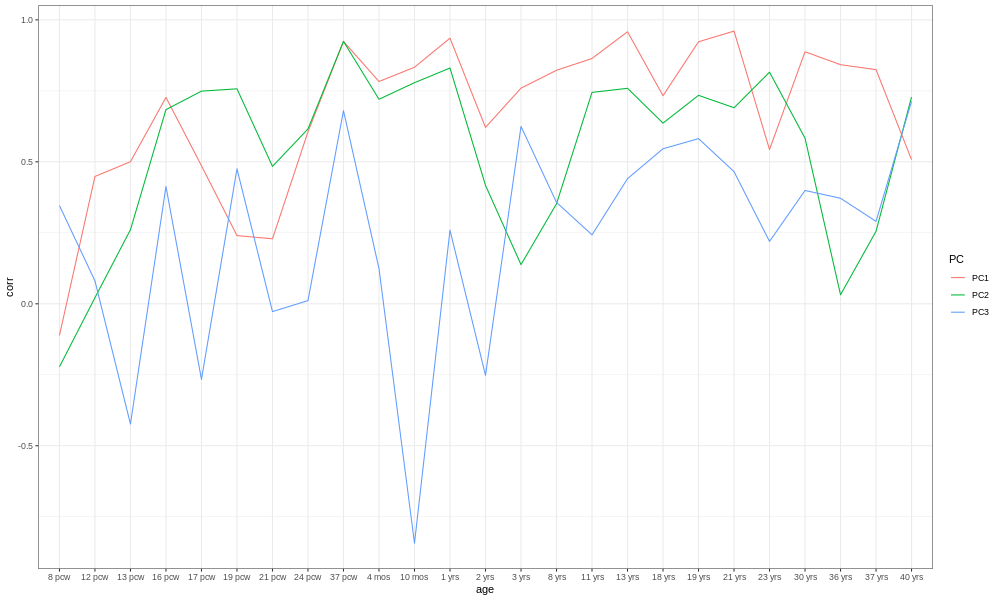

In [754]:
%%R -i bs_pcs_corr -w 1000 -h 600
ggplot(bs_pcs_corr) + geom_line(aes(x=age, y=corr, color=PC, group=PC)) + 
# scale_x_discrete(limits=rev) +
theme_bw()

In [755]:
age_groups = get_age_groups()

In [959]:
bs_pcs_corr = (bs_pcs
 # .loc[lambda x: x.index.map(lambda y: y[0] != '37 yrs'), :]
 .assign(age_group = lambda x: x.index.get_level_values(0).map(age_groups))
 .assign(age_group = lambda x: pd.Categorical(x['age_group'], ordered=True, 
                                              categories = x['age_group'].unique()))
 .groupby(['age_group', 'cortex']).mean()
 # .loc[['21 yrs', '23 yrs', '30 yrs', '36 yrs', '37 yrs', '40 yrs'], :]
 # .loc[lambda x: x.index.map(lambda y: y[0] not in ['19 yrs']), :]
 # .groupby('cortex').mean()
 .groupby('age_group')
 .corrwith(hcp_cortex)
 .iloc[:,:3].set_axis(['PC1','PC2','PC3'], axis=1)
 .melt(var_name='PC', value_name='corr', ignore_index=False)
 .reset_index().rename(columns={'age_group':'age'})
)
# bs_pcs_corr

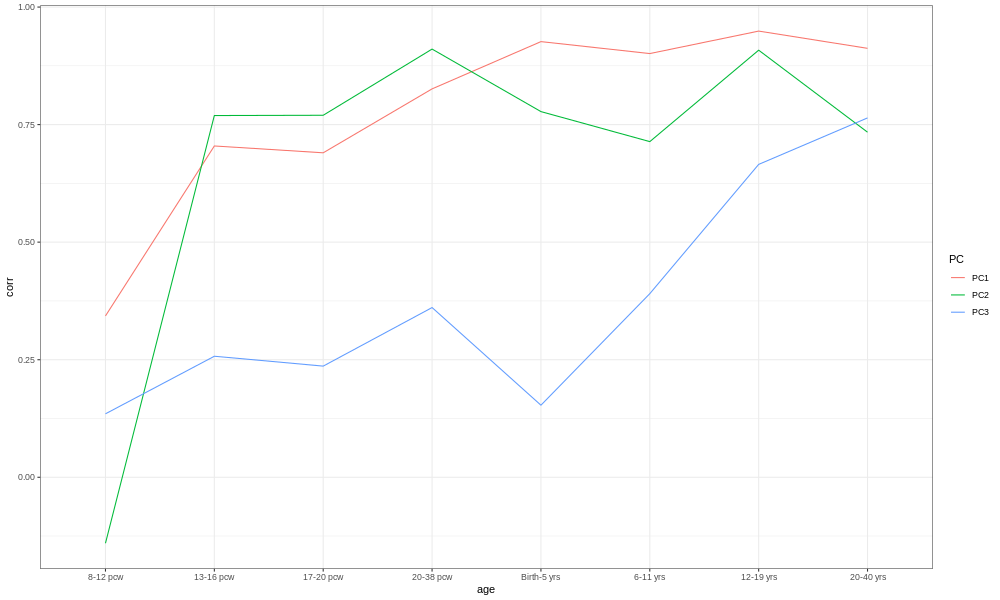

In [960]:
%%R -i bs_pcs_corr -w 1000 -h 600
bs_pcs_corr %>% 
# mutate(corr = ifelse(PC=='PC2', -corr, corr)) %>%
ggplot() + geom_line(aes(x=age, y=corr, color=PC, group=PC)) + 
# scale_x_discrete(limits=rev) +
theme_bw()

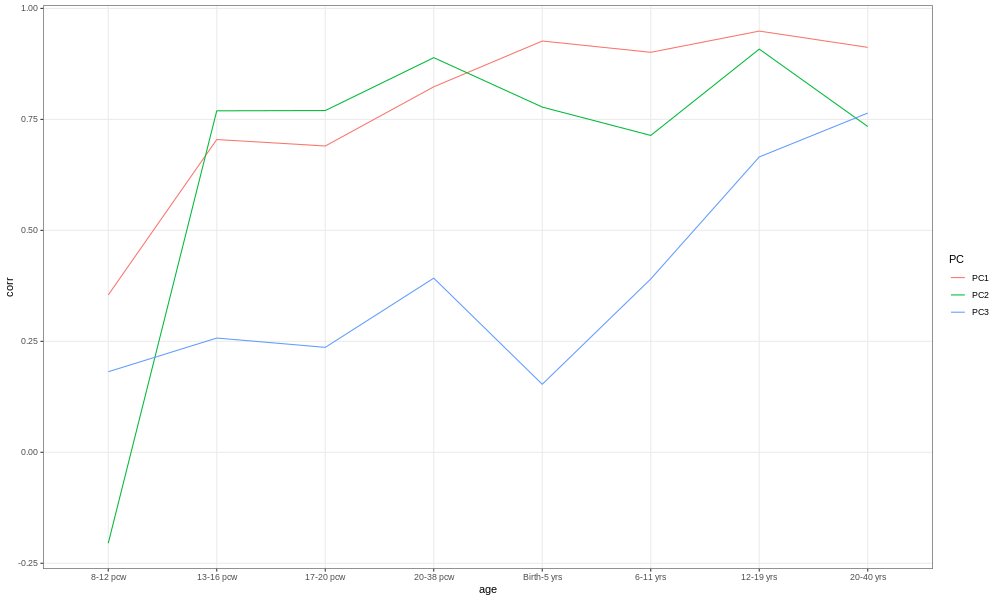

In [785]:
%%R -i bs_pcs_corr -w 1000 -h 600
bs_pcs_corr %>% 
# mutate(corr = ifelse(PC=='PC2', -corr, corr)) %>%
ggplot() + geom_line(aes(x=age, y=corr, color=PC, group=PC)) + 
# scale_x_discrete(limits=rev) +
theme_bw() + theme(panel.grid.minor=element_blank())

# Correlation of individual genes?

Get AHBA expression mean over HCP cortices

In [685]:
version = hcp_3donors
gene_mask = version.coefs.columns.intersection(bs_agg.columns)

hcp_filtered_genes = (version.expression
 .join(get_labels_hcp())
 .rename_axis('id')
 .join(hcp_bs.set_index('region'), on='label')
 .dropna(axis=0)
)

hcp_mean_genes = (hcp_filtered_genes
 .groupby('cortex')
 .mean()
 .loc[:, gene_mask]
)

Get brainspan genes

In [686]:
bs_genes = (bs_agg
            .loc[:, gene_mask].reset_index(level=0, drop=True)
            .assign(cortex = lambda x: x.index.map(bs_hcp_map))
            .set_index('cortex')
           )

Get correlation of matching genes with Brainspan

In [687]:
genes_corr = hcp_mean_genes.corrwith(bs_genes).to_frame('corr')
genes_corr_with_stability = genes_corr.join(hcp_3donors.stability).assign(cutoff = lambda x: x['DS'] >= np.quantile(x['DS'], .9))

In [ ]:
# sort_genes(genes_corr, 'corr').to_csv("../outputs/AHBA_BS_corr_genes_ds5.csv")

In [ ]:
# genes_corr_ds9 = genes_corr
# genes_corr_ds5 = genes_corr
# genes_corr_ds5.join(genes_corr_ds9, rsuffix='_ds9').dropna()

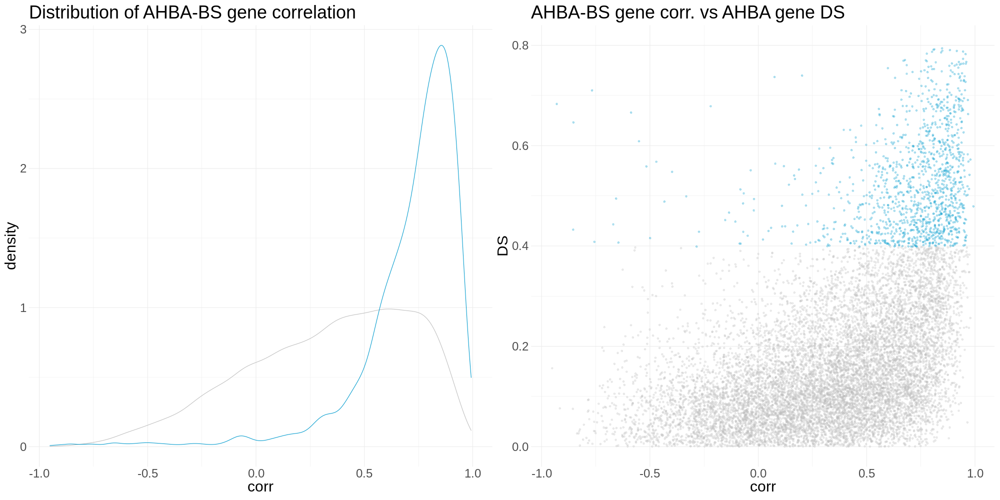

In [688]:
%%R -i genes_corr_with_stability -w 2000 -h 1000
g1 <- ggplot() + 
geom_density(data=genes_corr_with_stability, aes(corr), color='grey') + 
geom_density(data=genes_corr_with_stability%>%filter(cutoff), aes(corr), color='deepskyblue3') + 
theme_minimal() + ggtitle('Distribution of AHBA-BS gene correlation')
g2 <- ggplot(genes_corr_with_stability) + 
geom_point(data=genes_corr_with_stability%>%filter(!cutoff), aes(x=corr, y=DS), color='grey', alpha=.3) + 
geom_point(data=genes_corr_with_stability%>%filter(cutoff), aes(x=corr, y=DS), color='deepskyblue3', alpha=.3) + 
ylim(0,.8) + theme_minimal() + ggtitle("AHBA-BS gene corr. vs AHBA gene DS")
(g1 | g2) & theme(text=element_text(size=30))

In [689]:
genes_corr_with_pcs = (version.coefs.T
                       .iloc[:,:3].set_axis([f'PC{i+1}' for i in range(3)], axis=1)
                       # .apply(abs)
                       .join(genes_corr).melt(id_vars=['corr'], ignore_index=False, var_name='PC', value_name='weight')
                      )
genes_corr_with_pcs

,corr,PC,weight
A1BG,0.389968,PC1,-0.013597
A1BG-AS1,NaN,PC1,-0.011040
A2M,0.370301,PC1,0.002475
A2ML1,-0.232088,PC1,0.003552
A3GALT2,NaN,PC1,0.002972
...,...,...,...
ZXDC,0.002131,PC3,-0.011176
ZYG11B,0.086538,PC3,0.006527
ZYX,0.950707,PC3,0.001759
ZZEF1,0.494394,PC3,-0.009781


Scatter plot of genes Brainspan correlation against PC weight

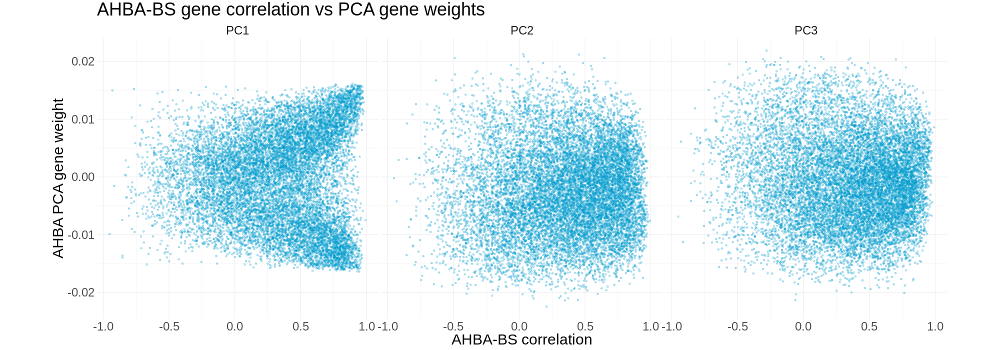

In [690]:
%%R -i genes_corr_with_pcs -w 2000 -h 700
ggplot(genes_corr_with_pcs, aes(x=corr, y=weight)) + facet_grid(.~PC) + geom_point(alpha=.3, color='deepskyblue3') + 
xlab('AHBA-BS correlation') + ylab('AHBA PCA gene weight') + ggtitle('AHBA-BS gene correlation vs PCA gene weights') +
theme_minimal() + theme(text=element_text(size=30), aspect.ratio=1) 

In [691]:
genes_corr_with_pcs.groupby('PC').corr().loc[pd.IndexSlice[:,'corr'], 'weight']

PC       
PC1  corr    0.031990
PC2  corr    0.047635
PC3  corr   -0.050608
Name: weight, dtype: float64

## So which DS filter? How many genes are 'real'?

### Plot all DS filter PCs

In [692]:
hcp_ds_versions = {
    'DS 0.5 (8.0k genes)': hcp_3donors_ds5,
    # 'DS 0.6 (6.4k genes)': hcp_3donors_ds6,
    # 'DS 0.7 (4.8k genes)': hcp_3donors_ds7,
    'DS 0.8 (3.2k genes)': hcp_3donors_ds8,
    'DS 0.9 (1.6k genes)': hcp_3donors_ds9
}

In [693]:
hcp_scores = (
    pd.concat({ 
        name:hcp_base.score_from(version) for name, version in hcp_ds_versions.items()
    })
              .reset_index(level=0).rename(columns={'level_0':'version'})
              .join(get_labels_hcp())
              .set_index(['version', 'label'])
              .apply(lambda y: y.groupby('version').apply(lambda x: (x-np.mean(x))/np.std(x)), axis=0) # standardize all versions for plotting
              .reset_index()
)
# hcp_scores

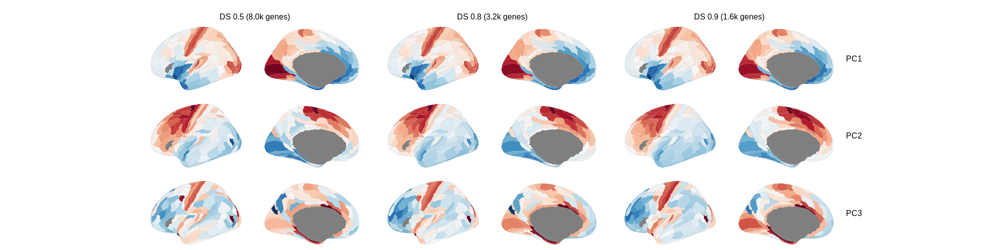

In [694]:
%%R -i hcp_scores -w 2000 -h 500

plot_hcp(hcp_scores, three=T) + 
guides(fill=F) &
theme(text=element_text(size=20))

## VE and Yeo?

In [852]:
HCPmappings = pd.read_csv("../data/vonEconomo_Yeo.csv")

In [857]:
version = hcp_3donors_ds9

In [858]:
# Lobe_cols = ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00"]
Lobe_colors = {'Fr':"#377EB8", 'Ins':"#E41A1C", 'Occ':"#4DAF4A", 'Par':"#984EA3", 'Temp':"#FF7F00"}
vonEconomo_labels = {1:'motor',2:'association',3:'association',4:'sensory',5:'sensory',6:'limbic',7:'insula'}
Yeo_labels = {1:'visual',2:'somatomotor',3:'dorsal attention',4:'ventral attention',5:'limbic',6:'frontoparietal',7:'default mode'}

df = (
 hcp_base.score_from(version)
 .apply(lambda x: x/np.std(x))
 .set_axis(['PC'+str(i+1) for i in range(5)],axis=1)
 .join(get_labels_hcp())
 .assign(L_label = lambda x: ['L_' + l for l in x['label']])
 .join(HCPmappings.set_index('HCP'), on='L_label')
 .join(fetch_hcp()['info'].set_index('id')[['Lobe','x-cog','y-cog','z-cog']])
 .rename({'x-cog':'x','y-cog':'y','z-cog':'z'},axis=1)
 .assign(Lobecolors = lambda x: x['Lobe'].map(Lobe_colors))
 .assign(vonEconomo_labels = lambda x: x['vonEconomo'].map(vonEconomo_labels))
 .assign(Yeo_labels = lambda x: x['Yeo'].map(Yeo_labels))
)
df

,PC1,PC2,PC3,PC4,PC5,label,L_label,Yeo,vonEconomo,vonEconomo.colors,Yeo.colors,pos_all1,pos_all2,pos_all3,Lobe,x,y,z,Lobecolors,vonEconomo_labels,Yeo_labels
label,,,,,,,,,,,,,,,,,,,,,
1,2.248181,-1.450172,1.642538,2.629118,0.058222,V1,L_V1,1.0,5.0,#fffb00,#660066,11.2100,49.8160,35.575,Occ,100.491589,41.138901,71.637040,#4DAF4A,sensory,visual
2,1.713368,-0.396266,0.029353,0.714762,-0.691486,MST,L_MST,1.0,4.0,#f59505,#660066,36.2500,34.0110,37.570,Occ,132.416667,58.901786,82.059524,#4DAF4A,sensory,visual
3,1.067818,0.508377,-1.911509,1.390324,-0.953686,V6,L_V6,1.0,4.0,#f59505,#660066,10.0960,35.7500,55.243,Occ,104.543112,44.481665,103.916749,#4DAF4A,sensory,visual
4,1.968819,-1.233922,1.130421,1.266245,-0.082600,V2,L_V2,1.0,4.0,#f59505,#660066,11.1790,46.8900,36.613,Occ,102.236656,44.064791,74.401125,#4DAF4A,sensory,visual
5,1.969572,-1.401667,0.742197,1.032544,0.299061,V3,L_V3,1.0,4.0,#f59505,#660066,14.5800,47.8790,37.700,Occ,107.926111,40.632159,76.961153,#4DAF4A,sensory,visual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,-0.882093,-0.808667,-0.024237,-0.953641,-0.369405,STSva,L_STSva,7.0,2.0,#220ced,#FF6666,47.7880,-20.2020,23.128,Temp,142.689243,118.134462,52.832669,#FF7F00,association,default mode
177,-0.841663,-0.757953,-0.757695,-1.391009,-0.763506,TE1m,L_TE1m,7.0,2.0,#220ced,#FF6666,56.7780,-7.0496,23.176,Temp,155.554922,101.395287,54.901178,#FF7F00,association,default mode
178,-1.349165,-1.177610,0.260939,1.126119,-1.280998,PI,L_PI,4.0,3.0,#067a08,#FF00FF,39.7870,-28.6810,22.045,Temp,134.650549,124.293407,56.102198,#FF7F00,association,ventral attention


In [859]:
scores_hcp_wide = hcp_base.score_from(version).apply(lambda x: x/np.std(x)).join(get_labels_hcp()).drop([3,4],axis=1)

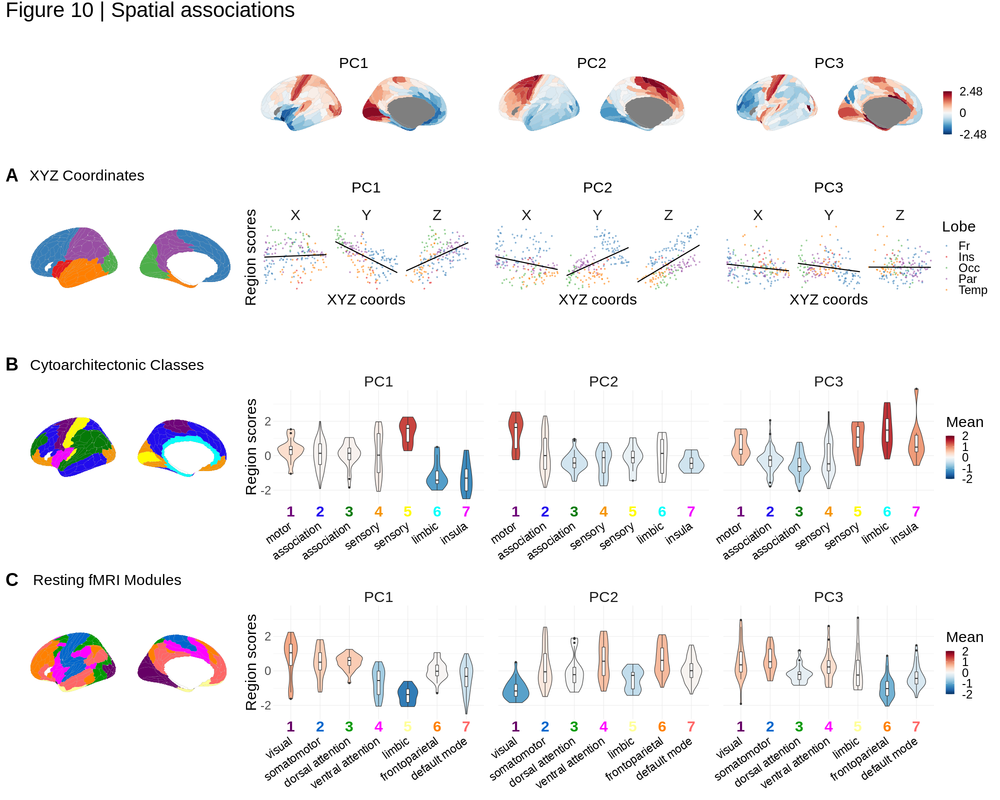

In [860]:
%%R -w 2000 -h 1600 -i df -i scores_hcp_wide
source("../code/brainPlots.R")
Lobe_colors = c('#377EB8', '#E41A1C', '#4DAF4A', '#984EA3', '#FF7F00')
g0 <- plot_hcp_classes(df, classes=Lobe, classcolors=Lobecolors) + ggtitle('XYZ Coordinates') + theme(plot.title=element_text(size=30, hjust=0.1))
g01 <- plot_xyz(df, PC1, 'PC1', colors=Lobe_colors)
g02 <- plot_xyz(df, PC2, 'PC2', colors=Lobe_colors)
g03 <- plot_xyz(df, PC3, 'PC3', colors=Lobe_colors)

g1 <- plot_hcp_classes(df, vonEconomo, vonEconomo.colors) + ggtitle('Cytoarchitectonic Classes') + theme(plot.title=element_text(size=30, hjust=0.25))
g1x <- plot_violins(df, vonEconomo, vonEconomo.colors, vonEconomo_labels)
g2 <- plot_hcp_classes(df, Yeo, Yeo.colors) + ggtitle('Resting fMRI Modules') + theme(plot.title=element_text(size=30, hjust=0.2))
g2x <- plot_violins(df, Yeo, Yeo.colors, Yeo_labels)

g5 <- plot_hcp_wide(scores_hcp_wide)

(
    ((plot_spacer() | g5 + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) /     
    ((g0 | ((g01|g02|g03) & plot_layout(tag_level='new'))) + plot_layout(widths=c(1,3),guides='collect') ) /
    ((g1 | g1x + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) / 
    ((g2 | g2x + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) /
    plot_spacer() & theme(text=element_text(size=30), strip.text=element_text(size=30))
) + plot_layout(heights=c(3,4,4,4,1)) +
    plot_annotation(tag_levels='A',title='Figure 10 | Spatial associations',
                theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-3.4))

## Weight genes by DS? 

In [699]:
# stab = hcp_3donors.stability
stab = pd.DataFrame(hcp_3donors.stability['DS'])#.clip(lower=0))

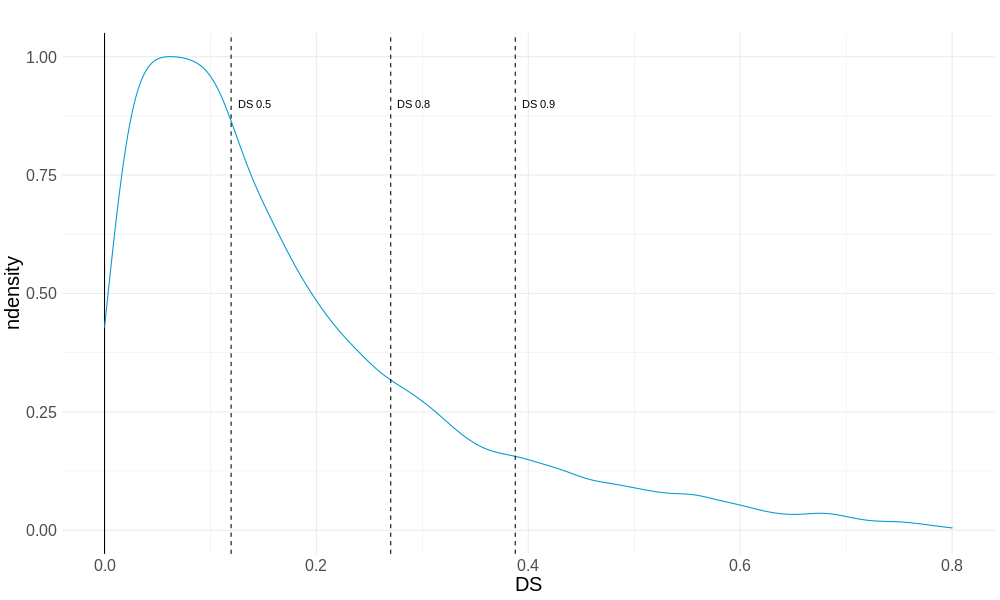

In [700]:
%%R -i stab -w 1000 -h 600
q <- c(.5,.8,.9)
ggplot(stab) + geom_vline(xintercept=0) + 
geom_density(aes(x=DS, y = after_stat(ndensity)), color='deepskyblue3') +
geom_vline(xintercept=quantile(stab$DS, q), linetype=2) +
annotate('text', x=quantile(stab$DS, q), y=.9, label=paste('DS',q), hjust=-.2) +
xlim(c(0,.8)) +
ggtitle('') + 
theme_minimal() + theme(text=element_text(size=20))

In [724]:
def sig(x, beta, nu, pos=0.38):
    return 1/(1+np.exp(np.multiply((x-pos), -beta)))**(1/nu)

x = np.linspace(0,1, 101)
nus = [1,5,10,20,25]
df=pd.DataFrame.from_dict({nu: sig(x,200,nu) for nu in nus}).assign(x=x)

In [703]:
betas = [20, 50, 100, 200]
df=pd.DataFrame.from_dict({b: sig(x,b,1,0.38) for b in betas}).assign(x=x)

In [811]:
nus = [1]
df=pd.DataFrame.from_dict({nu: sig(x,30,nu, pos=0.25) for nu in nus}).assign(x=x)

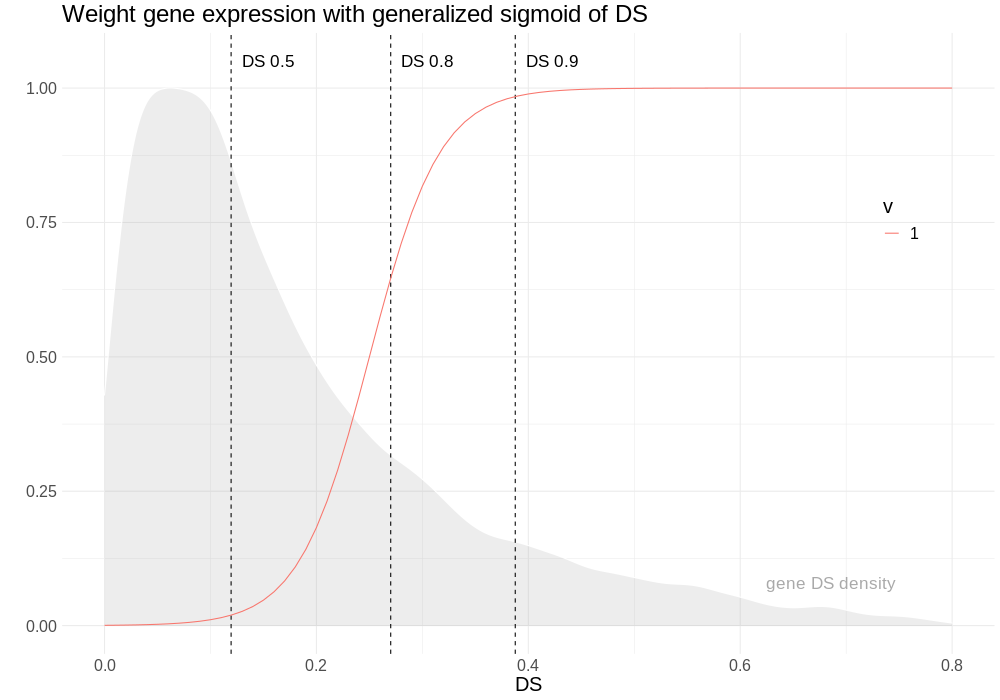

In [812]:
%%R -i df -i stab -w 1000 -h 700
q <- c(.5,.8,.9)

df %>% gather(v, y,-x) %>%
# mutate(v = factor(v, levels=c(1,5,10,20,25))) %>%
# mutate(b = factor(b, levels=c(200,100,50,20))) %>%
ggplot() + 
geom_density(data=stab, aes(x=DS, y = after_stat(ndensity)), 
             fill='darkgrey', alpha=.2, color='white') +
geom_vline(xintercept=quantile(stab$DS,q), linetype=2) +
annotate('text', x=quantile(stab$DS, q), y=1.05, label=paste('DS',q), hjust=-.2, size=6) +
annotate('text', x=.6, y=.08, label='gene DS density', color='darkgrey', hjust=-.2, size=6) +
geom_line(aes(x,y,color=v)) + 
xlim(0,.8) + ylab('') +
ggtitle("Weight gene expression with generalized sigmoid of DS") +
theme_minimal() + theme(text=element_text(size=20), legend.position = c(.9,.7))

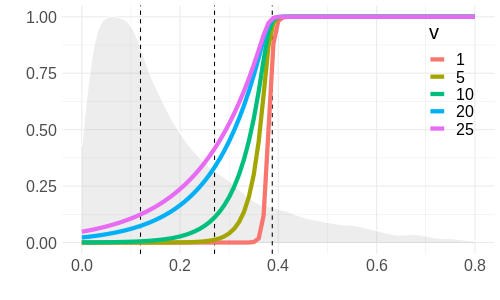

In [707]:
%%R -i df -i stab -w 500 -h 300
q <- c(.5,.8,.9)

df %>% gather(v, y,-x) %>%
mutate(v = factor(v, levels=c(1,5,10,20,25))) %>%
# mutate(b = factor(b, levels=c(200,100,50,20))) %>%
ggplot() + 
geom_density(data=stab, aes(x=DS, y = after_stat(ndensity)), 
             fill='darkgrey', alpha=.2, color='white') +
geom_vline(xintercept=quantile(stab$DS,q), linetype=2) +
# annotate('text', x=quantile(stab$DS, q), y=1.05, label=paste('DS',q), hjust=-.2, size=6) +
# annotate('text', x=.6, y=.08, label='gene DS density', color='darkgrey', hjust=-.2, size=6) +
geom_line(aes(x,y,color=v), size=2) + 
xlim(0,.8) + ylab('') + xlab('') +
# ggtitle("Weight gene expression with generalized sigmoid of DS") +
theme_minimal() + theme(text=element_text(size=20), legend.position = c(.9,.7))

In [861]:
weights = sig(hcp_3donors.stability['DS'], beta=30, nu=0.02, pos=0.04)
# weights = sig(hcp_3donors.stability['DS'], beta=30, nu=1, pos=0.25)
hcp_3donors_weights = pcaVersion(hcp_3donors_ds5.expression * weights, scale=False)
print("Corr:")
hcp_3donors_weights.corr_coefs(hcp_3donors_ds5).pipe(np.diag)[:3]

New PCA version
Corr:


array([0.92887727, 0.87953087, 0.82850981])

Now compare brainspan

In [862]:
version = hcp_3donors_weights
hcp_scores, cortex_scores, corrs = get_scores(version, bs_agg, hcp_bs, hcp_info, hcp_base)

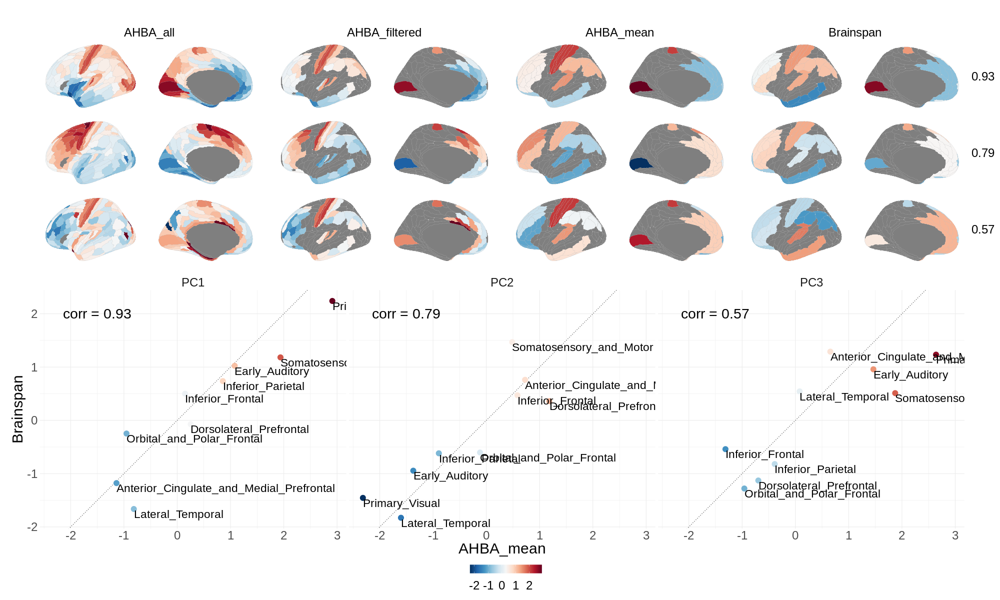

In [863]:
%%R -i hcp_scores -i corrs -w 2000 -h 1200
source("../code/brainspan.R")
g1 <- plot_ahba_bs_brains(hcp_scores, corrs)
g2 <- plot_ahba_bs_scatter(cortex_scores, corrs)
g1 / g2

In [810]:
# output_PC_gene_ranks(hcp_3donors_weights, 'hcp_weights_ds5_x25_b30_v1')

## Or ... just hard filter for genes that correlate with Brainspan??

In [729]:
np.quantile(genes_corr_with_stability['corr'], .5)

0.3910749606900203

In [749]:
gene_list_high_corr = (genes_corr_with_stability
 .loc[lambda x: x['corr'] >= np.quantile(x['corr'], .2)]
 .loc[lambda x: x['DS'] >= np.quantile(x['DS'], .5)]
 .index
)

hcp_3donors_corr5 = pcaVersion(hcp_3donors.expression.loc[:, gene_list_high_corr])
hcp_3donors_corr5.coefs.shape

New PCA version


(5, 5071)

In [750]:
version = hcp_3donors_corr5
hcp_scores, cortex_scores, corrs = get_scores(version, bs_agg, hcp_bs, hcp_info, hcp_base)

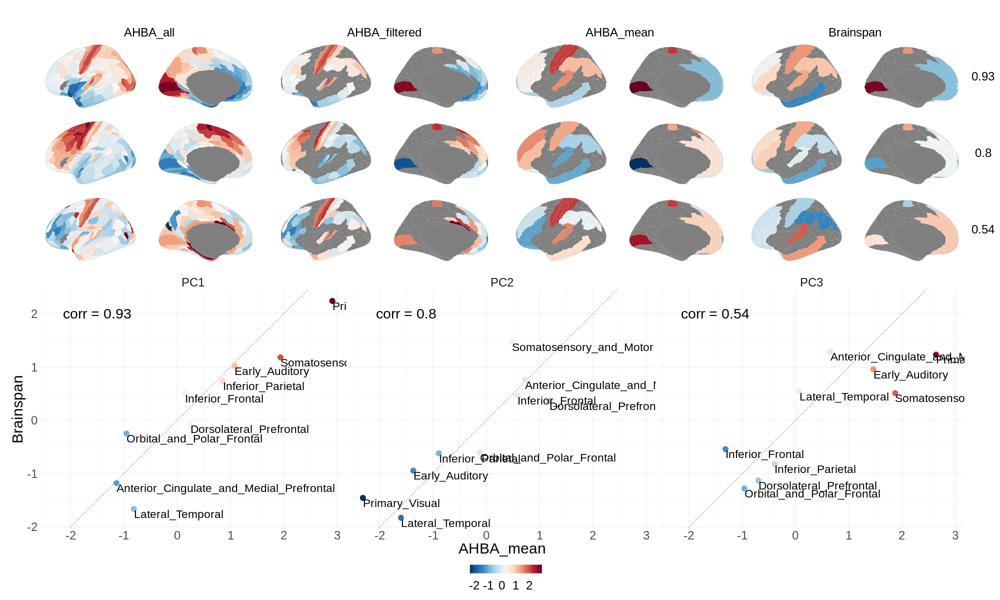

In [751]:
%%R -i hcp_scores -i corrs -w 2000 -h 1200
source("../code/brainspan.R")
g1 <- plot_ahba_bs_brains(hcp_scores, corrs)
g2 <- plot_ahba_bs_scatter(cortex_scores, corrs)
g1 / g2

## Regional correlations of excluded genes?

First make function that correlates all the genes with the PCs

In [29]:
def correlate_genes_pcs(pc_scores, gene_expression):
    df = pd.concat([pc_scores, gene_expression], axis=1).dropna() # using base creates NA rows
    corr = np.corrcoef(df.values, rowvar=False) # do correlation in numpy
    out = pd.DataFrame(corr, columns=df.columns).iloc[:5,5:] # format output
    return out

Then get the correlation of all genes with the PCs for each DS filter, first from the same expression matrix, then from the base expression matrix

In [30]:
for name, version in hcp_ds_versions.items():
    version.gene_corr_self = correlate_genes_pcs(
        version.scores, version.expression.iloc[:,:]) # corr self genes with self PCs
    version.gene_corr_base = correlate_genes_pcs(
        version.scores, hcp_base.expression.iloc[:,:]) # corr all genes with self PCs
    print(f'Correlated genes with PCs for {name}')

Correlated genes with PCs for DS 0.5 (8.0k genes)
Correlated genes with PCs for DS 0.6 (6.4k genes)
Correlated genes with PCs for DS 0.7 (4.8k genes)
Correlated genes with PCs for DS 0.8 (3.2k genes)
Correlated genes with PCs for DS 0.9 (1.6k genes)


Separate the base matrix into included and excluded genes, combine into one df

In [31]:
for name, version in hcp_ds_versions.items():
    included = version.gene_corr_base.columns.intersection(version.coefs.columns)
    excluded = version.gene_corr_base.columns.difference(version.coefs.columns)
    version.gene_corr_inc = version.gene_corr_base.loc[:, included]
    version.gene_corr_exc = version.gene_corr_base.loc[:, excluded]

    version.gene_corr_split = (pd.concat({
        'self': version.gene_corr_self.T,
        'included': version.gene_corr_inc.T,
        'excluded': version.gene_corr_exc.T
    })
     .iloc[:, :3]
     .reset_index(level=0)
     .set_axis(['type'] + [f'PC{i+1}' for i in range(3)], axis=1)
    )    
    
hcp_3donors_ds5.gene_corr_split.head()

,type,PC1,PC2,PC3
A1BG,self,-0.791066,-0.144869,0.053260
A1BG-AS1,self,-0.621560,-0.103477,-0.312323
AAAS,self,0.608615,0.218765,0.042873
AAED1,self,-0.721398,0.007776,0.233313
AAGAB,self,-0.270646,0.446661,-0.512720


Combine all versions and format for plotting

In [32]:
df = (pd.concat({
    name:version.gene_corr_split for name, version in hcp_ds_versions.items()
})
 .reset_index(level=0)
 .melt(id_vars=['level_0', 'type'])
 .set_axis(['version', 'type', 'component', 'corr'], axis=1)
)
df.head()

,version,type,component,corr
0,DS 0.5 (8.0k genes),self,PC1,-0.791066
1,DS 0.5 (8.0k genes),self,PC1,-0.621560
2,DS 0.5 (8.0k genes),self,PC1,0.608615
3,DS 0.5 (8.0k genes),self,PC1,-0.721398
4,DS 0.5 (8.0k genes),self,PC1,-0.270646


In [33]:
abs_mean = (df
 .assign(corr = lambda x: x['corr'].abs())
 .groupby(['version', 'type', 'component'])
 .mean()
 .reset_index()
 .assign(position = lambda x: x['type'].map({'self':-0.8, 'included':0, 'excluded':0.8}))
)
abs_mean.head()

,version,type,component,corr,position
0,DS 0.5 (8.0k genes),excluded,PC1,0.239066,0.8
1,DS 0.5 (8.0k genes),excluded,PC2,0.199866,0.8
2,DS 0.5 (8.0k genes),excluded,PC3,0.219587,0.8
3,DS 0.5 (8.0k genes),included,PC1,0.540706,0.0
4,DS 0.5 (8.0k genes),included,PC2,0.264554,0.0


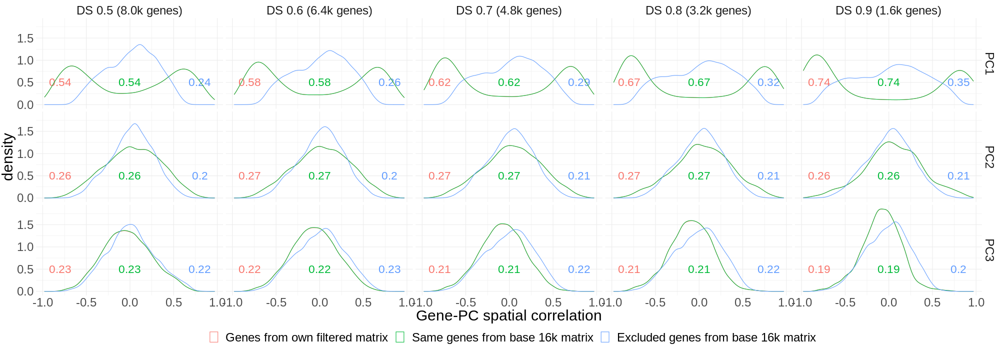

In [34]:
%%R -i df -i abs_mean -w 2000 -h 700
df <- df %>% 
mutate(type = factor(type, 
                     levels=c('self', 'included', 'excluded'), 
                     labels=c('Genes from own filtered matrix',
                              'Same genes from base 16k matrix',
                              'Excluded genes from base 16k matrix')
                    )
      )

abs_mean <- abs_mean %>%
mutate(type = factor(type, 
                     levels=c('self', 'included', 'excluded'), 
                     labels=c('Genes from own filtered matrix',
                              'Same genes from base 16k matrix',
                              'Excluded genes from base 16k matrix')
                    )
      )

ggplot(df) + 
facet_grid(component ~ version) + 
geom_text(data=abs_mean, aes(label=round(corr, 2), x=position, group=type, color=type), 
          y=0.5, size=8, show.legend = FALSE) +
geom_density(aes(x=corr, color=type)) +
xlab('Gene-PC spatial correlation') +
guides(color=guide_legend(title='')) +
theme_minimal() +
theme(text=element_text(size=30), legend.position='bottom')